kiet vu- k2104679
all exercise except the last one.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Linear regression



## **Exercise 1:** [Combined cycle powerplant-dataset](https://www.kaggle.com/datasets/gova26/airpressure)





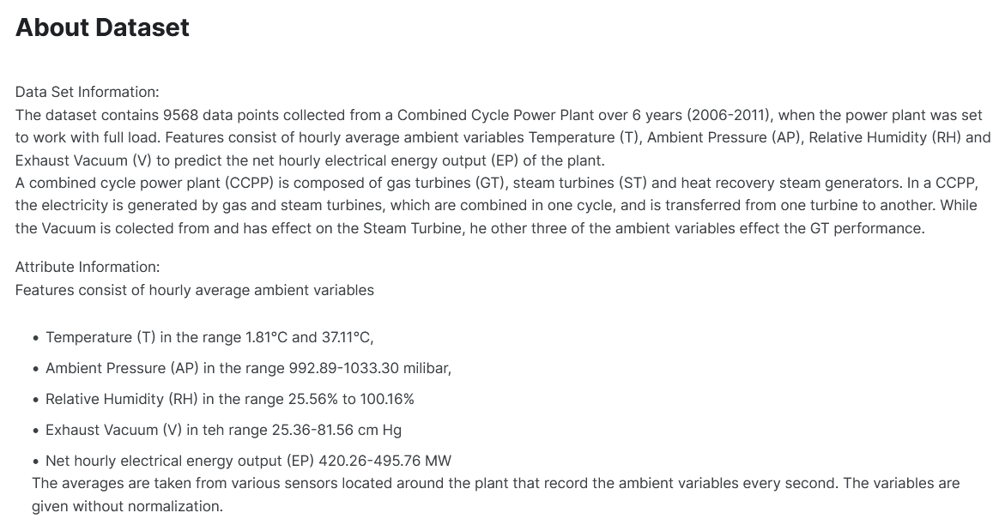

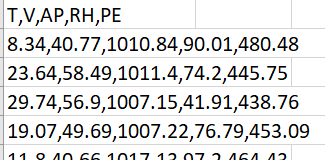

Load Folds5x2_pp.csv to Colab

In [5]:
#read the dataset into a matrix data
data=np.loadtxt('/content/sample_data/Folds5x2_pp.csv', delimiter=',', skiprows=1)
X=data[:,:4] #coodinates [x1,x2,x3,x4]=[T,V,AP,RH] as rows
y=data[:,4] #values of PE to be predicted

print(X[:5,:])
print(y[:5])

[[   8.34   40.77 1010.84   90.01]
 [  23.64   58.49 1011.4    74.2 ]
 [  29.74   56.9  1007.15   41.91]
 [  19.07   49.69 1007.22   76.79]
 [  11.8    40.66 1017.13   97.2 ]]
[480.48 445.75 438.76 453.09 464.43]


Draw pictures like below of the distributions of values of the coordinates and $y=PE$

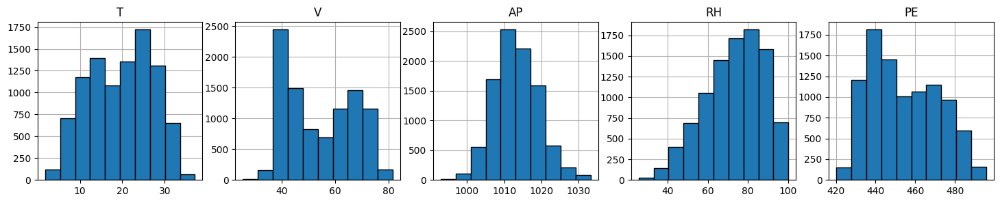

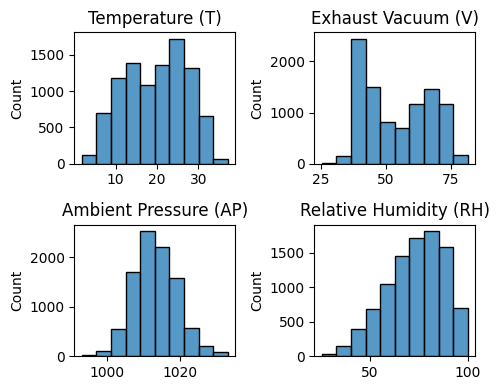

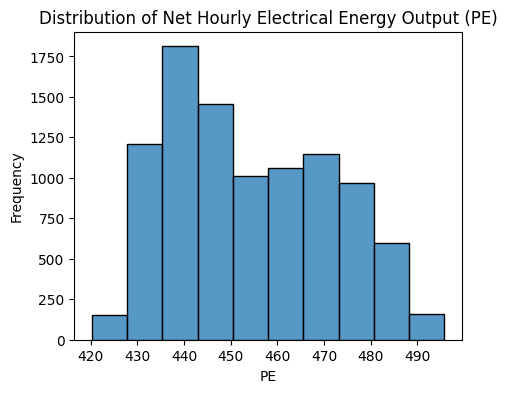

In [6]:
import seaborn as sns
# Plot distributions of coordinates (X)
fig, axes = plt.subplots(2, 2, figsize=(5, 4))
axes = axes.flatten()
labels = ['Temperature (T)', 'Exhaust Vacuum (V)', 'Ambient Pressure (AP)', 'Relative Humidity (RH)']

for i in range(X.shape[1]):
    sns.histplot(X[:, i], ax=axes[i], bins=10)
    axes[i].set_title(labels[i])

plt.tight_layout()
plt.show()

# Plot distribution of target variable (y)
plt.figure(figsize=(5, 4))
sns.histplot(y, bins=10)
plt.title('Distribution of Net Hourly Electrical Energy Output (PE)')
plt.xlabel('PE')
plt.ylabel('Frequency')
plt.show()

and on the dependance of $y=PE$ on the coordinates $T,V,AP,RH$

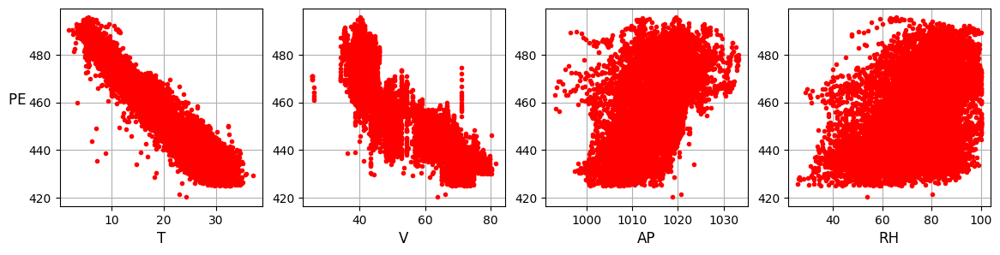

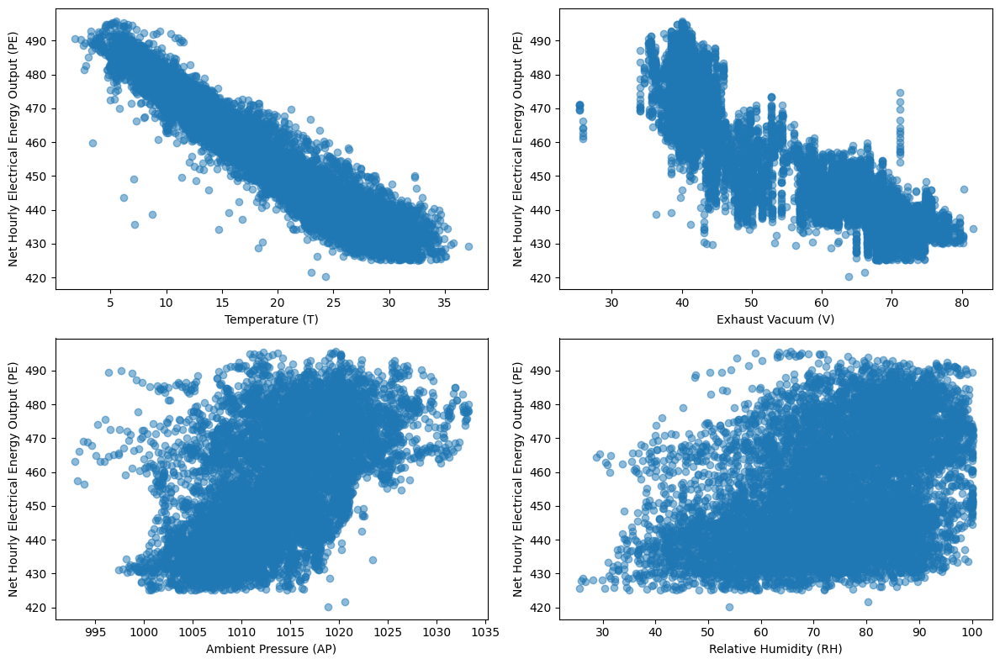

In [7]:
# Plot dependence
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()
labels = ['Temperature (T)', 'Exhaust Vacuum (V)', 'Ambient Pressure (AP)', 'Relative Humidity (RH)']

for i in range(X.shape[1]):
    axes[i].scatter(X[:, i], y, alpha=0.5)
    axes[i].set_xlabel(labels[i])
    axes[i].set_ylabel('Net Hourly Electrical Energy Output (PE)')

plt.tight_layout()
plt.show()

Find coefficients to a  formula  
$$
y=w_1\widehat{x}_1+w_2\widehat{x}_2+w_3\widehat{x}_3+w_4\widehat{x}_4+b
$$

using the scaled coordinates

$$
\widehat{x}_j=\frac{x_j-\mu_j}{\sigma_j},\quad j=1,2,3,4
$$



(ans: $w=[-14.737, -2.972,   0.369,  -2.308],\,b=
454.365$)


 and draw a picture like below

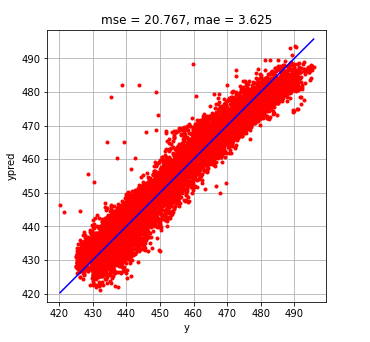

Coefficients (w): [-14.73659333  -2.97242952   0.36867791  -2.30751179]
Intercept (b): 454.36500940635386


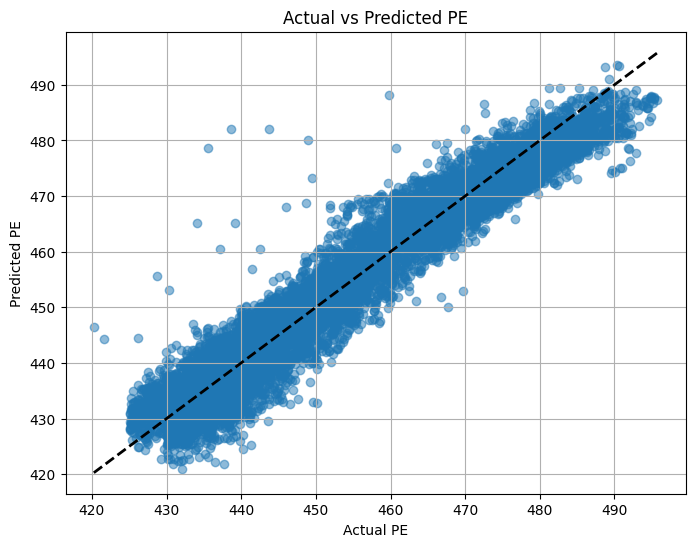

In [10]:
from sklearn.linear_model import LinearRegression
# Scale the coordinates
mean_X = np.mean(X, axis=0)
std_X = np.std(X, axis=0)
X_scaled = (X - mean_X) / std_X

# Train
model = LinearRegression()
model.fit(X_scaled, y)

# the coefficients and intercept
w = model.coef_
b = model.intercept_

print("Coefficients (w):", w)
print("Intercept (b):", b)

y_pred = np.dot(X_scaled, w) + b

# Plot predicted vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, alpha=0.5)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.xlabel('Actual PE')
plt.ylabel('Predicted PE')
plt.title('Actual vs Predicted PE')
plt.grid(True)
plt.show()

Calculate the predicted value for $y$, when
$x=[8,40,1050,95]$

(ans: 479.60)

In [11]:
x = np.array([8, 40, 1050, 95])

mean_X = np.mean(X, axis=0)
std_X = np.std(X, axis=0)
x_scaled = (x - mean_X) / std_X

y_pred = np.dot(x_scaled, w) + b

print("Predicted value for y:", y_pred)

Predicted value for y: 479.6044637517668


## **Exercise 2:**



Use the points $x^{(i)},y^{(i)}$ given below to find a formula

$$
y=w_1x^2+w_2x+b
$$

using linear regression for datapoints

$$
[x_1^{(i)},x_2^{(i)}],\,y^{(i)}
$$

where

$$x_1^{(i)}=(x^{(i)})^2,\,x_2^{(i)}=x^{(i)}$$

and draw pictures like below

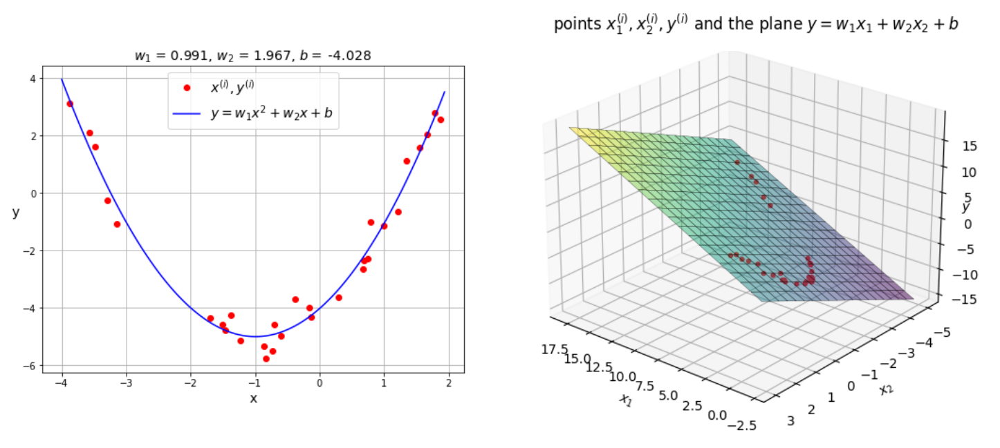

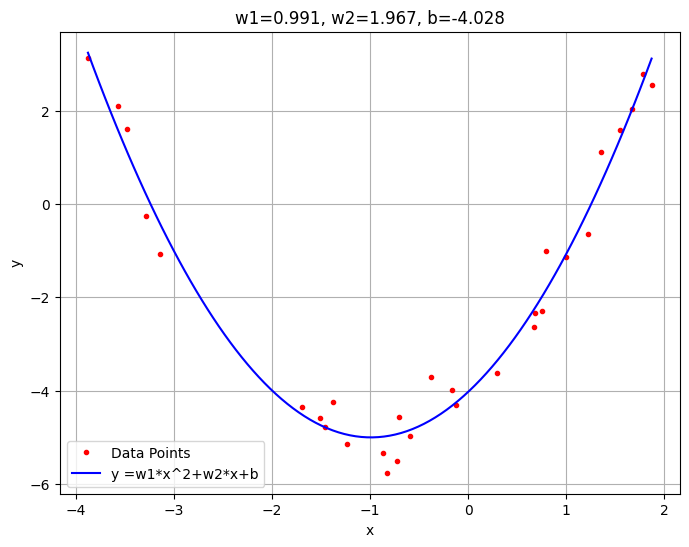

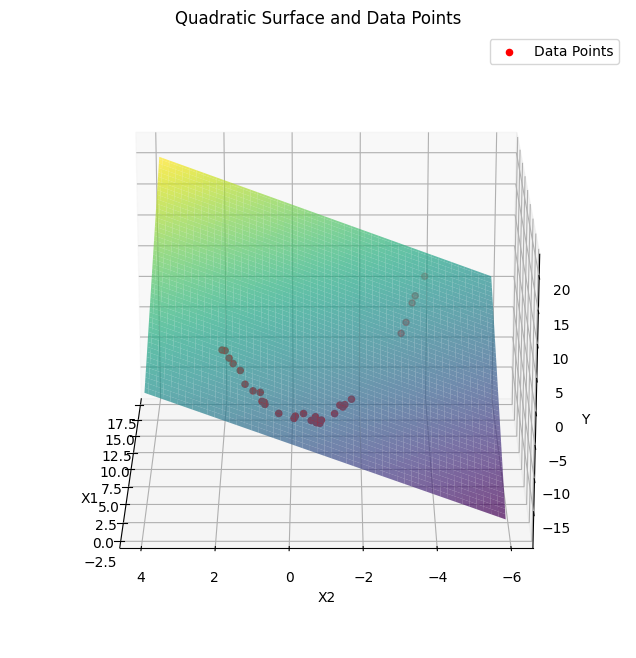

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LinearRegression

# Given data points
m = 30
A = 1
B = 2
C = -4
x0 = -B / (2 * A)
L = 3
np.random.seed(0)

x = np.random.uniform(x0 - L, x0 + L, m)
error = np.random.normal(0, 0.4, m)
y = A * x**2 + B * x + C + error

x1 = x**2
x2 = x
X = np.column_stack((x1, x2))

model = LinearRegression().fit(X, y)
w1, w2 = model.coef_
b = model.intercept_

x_fit = np.linspace(np.min(x), np.max(x), 100)
y_fit = w1 * x_fit**2 + w2 * x_fit + b


X1, X2 = np.meshgrid(np.linspace(np.min(x1)-2, np.max(x1)+2, 100),
                      np.linspace(np.min(x2)-2, np.max(x2)+2, 100))
Y_plane = w1 * X1 + w2 * X2 + b

# Plot the 2D graph
plt.figure(figsize=(8, 6))
plt.plot(x, y, 'r.', label='Data Points')
plt.plot(x_fit, y_fit, 'b-', label=f'y =w1*x^2+w2*x+b')
plt.xlabel('x')
plt.ylabel('y')
plt.title(f'w1={w1:.3f}, w2={w2:.3f}, b={b:.3f}')
plt.legend()
plt.grid(True)
plt.show()

# Plot the 3D graph
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
ax.scatter(x1, x2, y, color='r', label='Data Points')

# Plot the plane
ax.plot_surface(X1, X2, Y_plane, cmap='viridis', alpha=0.7)

ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('Y')
ax.set_title('Quadratic Surface and Data Points')
ax.legend()
ax.view_init(elev=20, azim=180)

plt.show()


## **Exercise 3:**



Find the coefficients (kertoimet in Finnish) $w_1,w_2,b$ in exercise 2
by minimizing the cost

$$
C=\frac{1}{m}\,\sum_{i=1}^m \left(w_1x^{(i)}_1+w_2x^{(i)}_2+b-y^{(i)}\right)^2
$$


using the gradient descent and draw pictures like below (päivityskierros = update in Finnish)


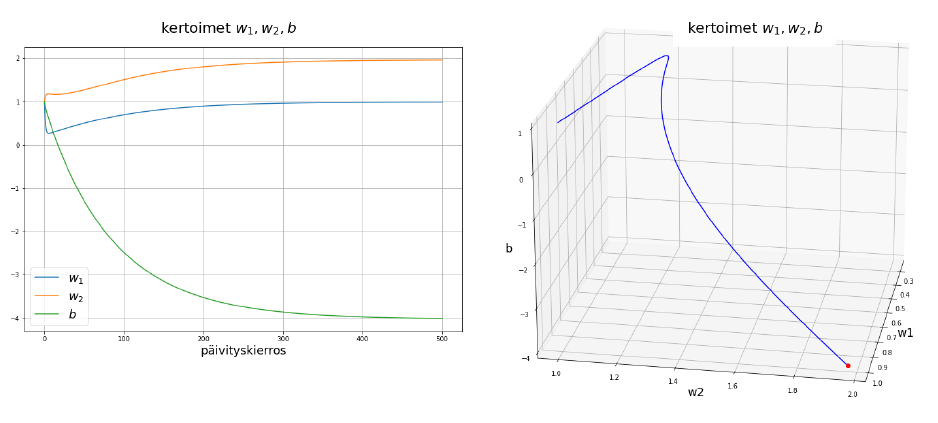

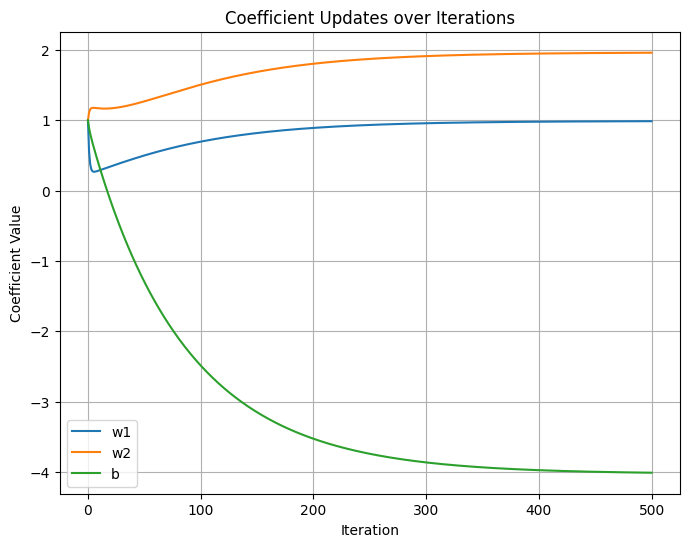

Final coefficients:
w1 = 0.9872851738355946
w2 = 1.9607965289115648
b = -4.010642128607478


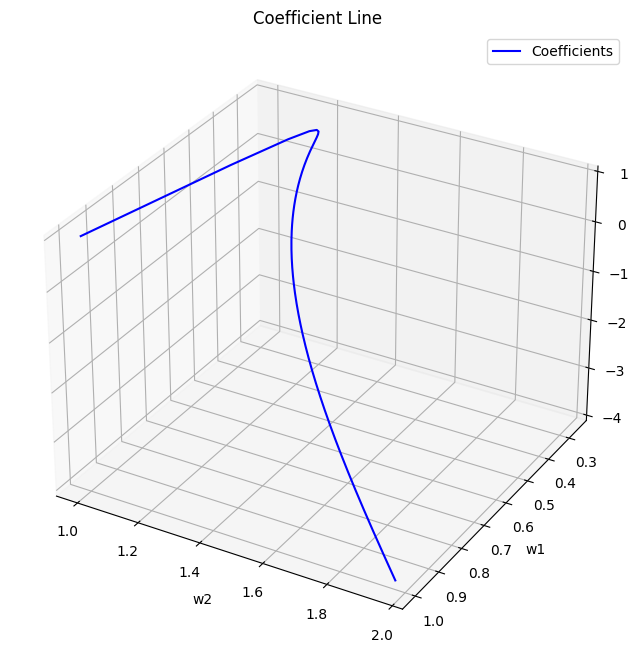

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Given data points
m = 30
A = 1
B = 2
C = -4
x0 = -B / (2 * A)
L = 3
np.random.seed(0)

x = np.random.uniform(x0 - L, x0 + L, m)
error = np.random.normal(0, 0.4, m)
y = A * x**2 + B * x + C + error


x1 = x**2
x2 = x

data = np.column_stack((x1, x2, y))

w1 = 1
w2 = 1
b = 1

alpha = 0.02
num_iters = 500

w1_values = [w1]
w2_values = [w2]
b_values = [b]


for iter in range(num_iters):

    predictions = np.dot(data[:, :2], np.array([w1, w2])) + b

    errors = predictions - data[:, 2]

    w1 -= alpha * (1/m) * np.sum(errors * data[:, 0])
    w2 -= alpha * (1/m) * np.sum(errors * data[:, 1])
    b -= alpha * (1/m) * np.sum(errors)

    w1_values.append(w1)
    w2_values.append(w2)
    b_values.append(b)

plt.figure(figsize=(8, 6))
plt.plot(range(num_iters + 1), w1_values, label='w1')
plt.plot(range(num_iters + 1), w2_values, label='w2')
plt.plot(range(num_iters + 1), b_values, label='b')
plt.xlabel('Iteration')
plt.ylabel('Coefficient Value')
plt.title('Coefficient Updates over Iterations')
plt.legend()
plt.grid(True)
plt.show()


print('Final coefficients:')
print(f'w1 = {w1}')
print(f'w2 = {w2}')
print(f'b = {b}')

# Plot 3D line for coefficients
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the line connecting the coefficients (w1, w2, b)
ax.plot(w2_values, w1_values, b_values, label='Coefficients', color='blue')

ax.set_xlabel('w2')
ax.set_ylabel('w1')
ax.set_zlabel('b')
ax.set_title('Coefficient Line')

ax.invert_yaxis()

plt.legend()
plt.show()


##**Exercise 4**

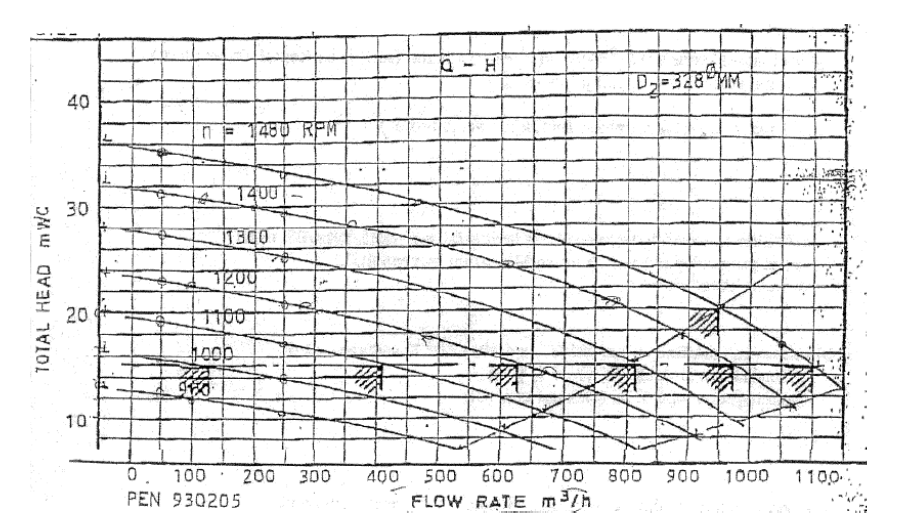

Load data_ex4.txt to Colab

In [ ]:
#read data into a matrix data
data=np.loadtxt('sample_data/data_ex4.txt',delimiter=',')
#rows [x1^(i),x2^(i),y^(i)] = [RPM/1000,FLOW RATE/100,TOTAL HEAD] (taken from the picture above)
data[:5,:]

array([[ 1.48,  0.  , 36.1 ],
       [ 1.48,  0.05, 35.6 ],
       [ 1.48,  0.1 , 35.2 ],
       [ 1.48,  0.15, 34.6 ],
       [ 1.48,  0.2 , 34.4 ]])

Use the points $x_1^{(i)},x_2^{(i)},y^{(i)}$ to find a formula

$$
y=w_1x_1^2+w_2x_2^2+w_3x_1+w_4x_2+b
$$


using linear regression for the datapoints

$$
[(x_1^{(i)})^2,(x_2^{(i)})^2,x_1,x_2],\quad y
$$

and draw pictures like below:

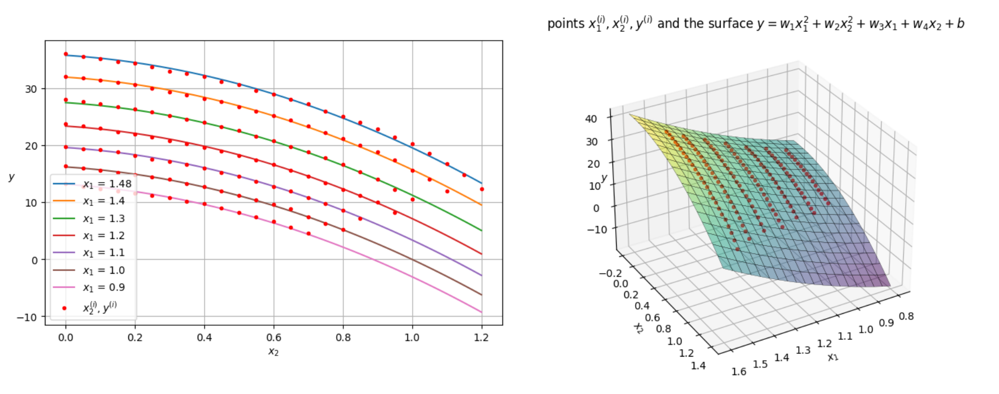

ans: $w_1=17.837,w_2=-12.299,w_3=-3.443,w_4=-3.924,b=1.803$

Coefficients:
w1 = 17.83664169260345, w2 = -12.298973768581364, w3 = -3.442523001260108, w4 = -3.9242498637287606, b = 1.8033396755807445
Formula:
y = 17.83664169260345 * x1^2 + -12.298973768581364 * x2^2 + -3.442523001260108 * x1 + -3.9242498637287606 * x2 + 1.8033396755807445


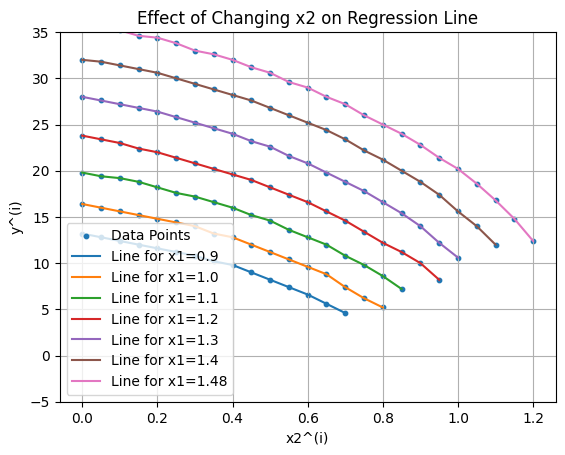

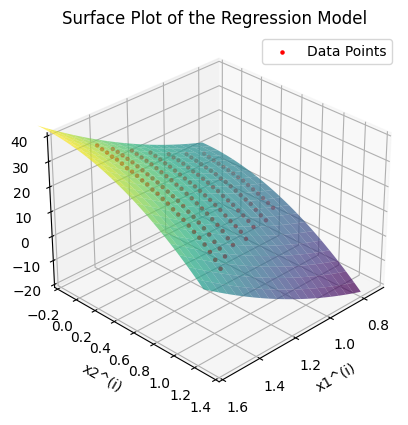

In [16]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

data = np.loadtxt('sample_data/data_ex4.txt', delimiter=',')

X = np.column_stack((data[:, 0]**2, data[:, 1]**2, data[:, 0], data[:, 1]))
y = data[:, 2]

# Perform linear regression
model = LinearRegression()
model.fit(X, y)

# Get the coefficients
w1, w2, w3, w4 = model.coef_
b = model.intercept_


print("Coefficients:")
print(f"w1 = {w1}, w2 = {w2}, w3 = {w3}, w4 = {w4}, b = {b}")


print("Formula:")
print(f"y = {w1} * x1^2 + {w2} * x2^2 + {w3} * x1 + {w4} * x2 + {b}")

# Plot the data points
plt.scatter(data[:, 1], data[:, 2], label='Data Points', s=10)
plt.xlabel('x2^(i)')
plt.ylabel('y^(i)')
plt.title('Effect of Changing x2 on Regression Line')
plt.ylim(-5, 35)


unique_x1 = np.unique(data[:, 0])
for x1_value in unique_x1:
    x1_subset = data[data[:, 0] == x1_value]
    plt.plot(x1_subset[:, 1], x1_subset[:, 2], label=f'Line for x1={x1_value}')

plt.legend()
plt.grid(True)
plt.show()
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data[:, 0], data[:, 1], data[:, 2], color='red', label='Data Points', s=5)


# 3D Surface Plot
def surface_function(x1, x2):
    return w1 * x1**2 + w2 * x2**2 + w3 * x1 + w4 * x2 + b

x1_range = np.linspace(min(data[:, 0])-0.1, max(data[:, 0])+0.2, 100)
x2_range = np.linspace(min(data[:, 1])-0.2, max(data[:, 1])+0.2, 100)
X1, X2 = np.meshgrid(x1_range, x2_range)
Y = surface_function(X1, X2)


ax.plot_surface(X1, X2, Y, cmap='viridis', rstride=5, cstride=5, alpha=0.7)
ax.set_xlabel('x1^(i)')
ax.set_ylabel('x2^(i)')
ax.set_zlabel('y^(i)')
ax.set_title('Surface Plot of the Regression Model')
ax.view_init(elev=30, azim=45)
ax.set_xlim(0.7, 1.6)
ax.set_ylim(-0.2, 1.4)
ax.set_zlim(-20, 40)
plt.legend()
plt.show()


# Logistic regression

##**Exercise 1**

[Breast cancer wisconsin (diagnostic) dataset](https://scikit-learn.org/stable/datasets/toy_dataset.html#breast-cancer-dataset) 569 datapoints, 30 variables, 2 classes



$$
x^{(i)}=[x^{(i)}_1,x_2^{(i)},...,x_{30}^{(i)}],\quad y^{(i)}=0,1
$$


$$
$$

Attribute Information:

    radius (mean of distances from center to points on the perimeter)

    texture (standard deviation of gray-scale values)

    perimeter

    area

    smoothness (local variation in radius lengths)

    compactness (perimeter^2 / area - 1.0)

    concavity (severity of concave portions of the contour)

    concave points (number of concave portions of the contour)

    symmetry

    fractal dimension (“coastline approximation” - 1)

The mean, standard error, and “worst” or largest (mean of the three worst/largest values) of these features were computed for each image, resulting in 30 features. For instance, field 0 is Mean Radius, field 10 is Radius SE, field 20 is Worst Radius.




    class:

            WDBC-Malignant

            WDBC-Benign



Draw a picture like below of the distributions of the values of coordinates $x_1,..,x_{30}$

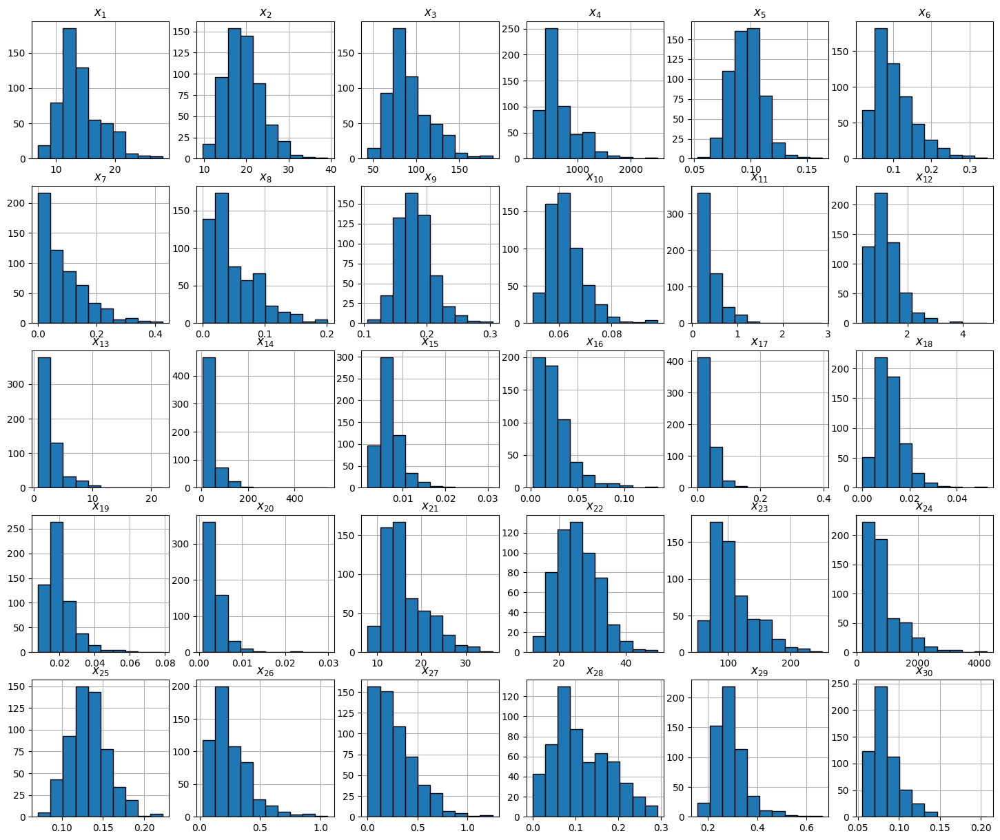

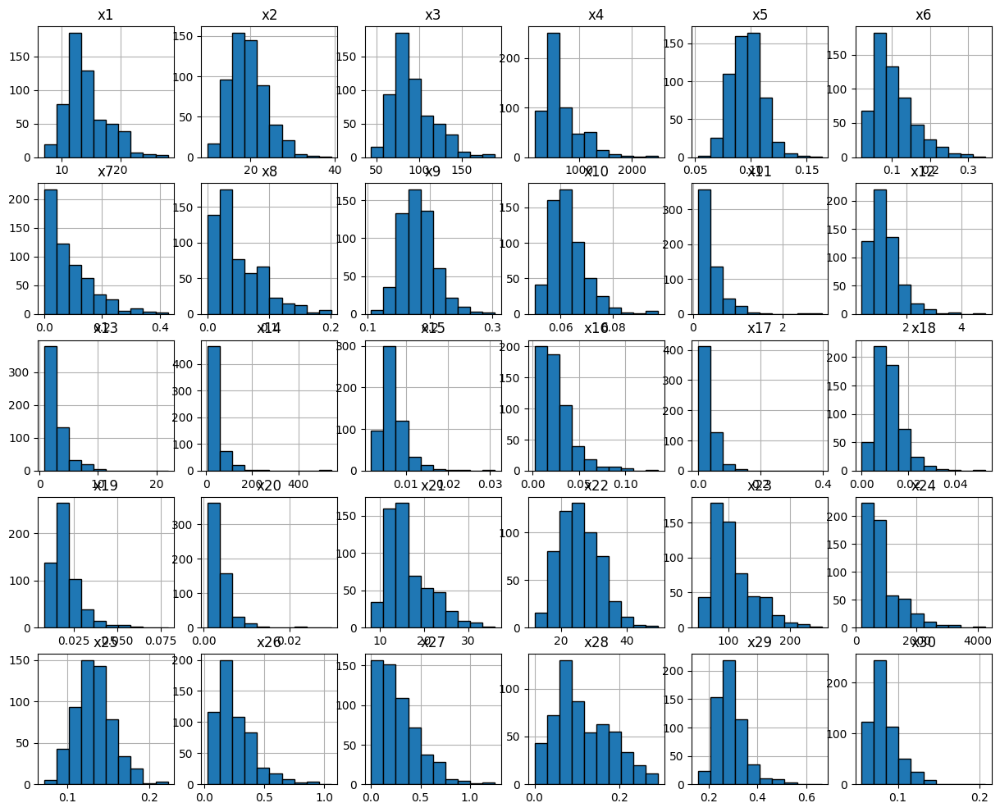

In [17]:
import matplotlib.pyplot as plt
from sklearn import datasets

X, y = datasets.load_breast_cancer(return_X_y=True)
n_features = X.shape[1]


plt.figure(figsize=(15, 12))
for i in range(n_features):
    plt.subplot(5, 6, i+1)
    plt.hist(X[:, i], edgecolor='k',zorder=2)
    plt.title(f"x{i+1}")
    plt.grid()



Find coefficients to a formula

$$
z=w_1\widehat{x}_1+w_2\widehat{x}_2+\dots+\widehat{x}_{30}+b
$$

for the classification of a point $x=[x_1,x_2,...,x_{30}]$ using the scaled coordinates (means $=0$ and standard deviations $=1$)
and draw a picture like below:

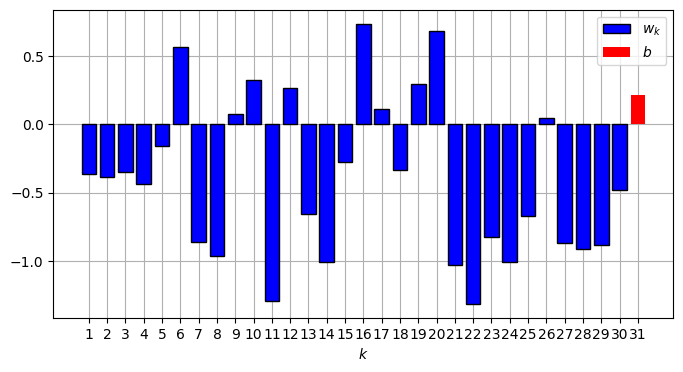

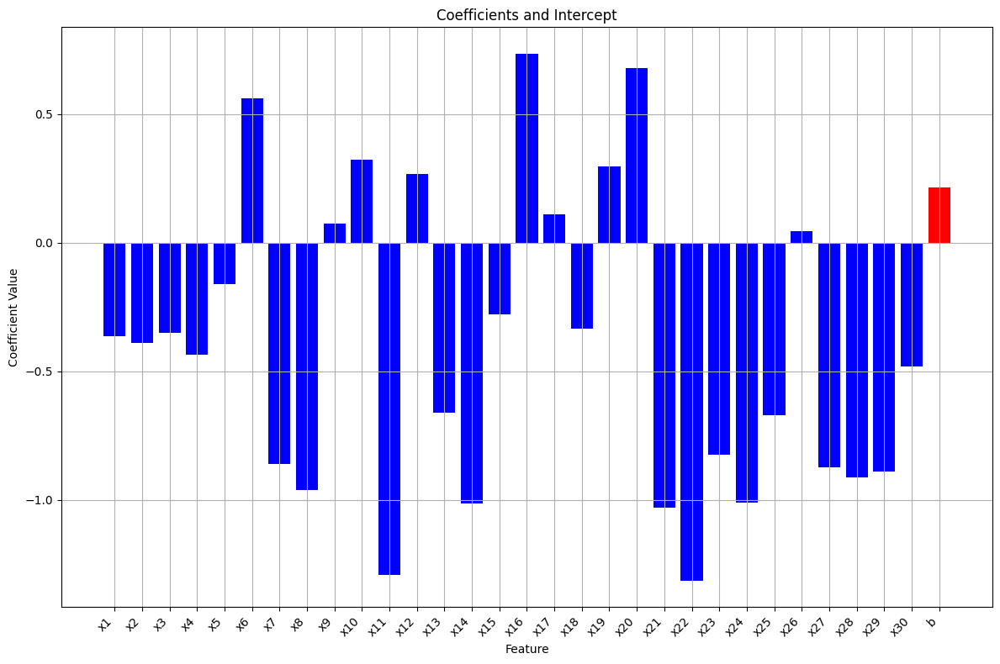

In [18]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

X, y = load_breast_cancer(return_X_y=True)


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = LogisticRegression()
model.fit(X_scaled, y)


coefficients = model.coef_
intercepts = model.intercept_

feature_names = [f"x{i}" for i in range(1, 31)]
feature_names.append("b")

coefficients_with_intercept = np.append(coefficients, intercepts)

# Define color
colors = ['b'] * 30 + ['r']

# Plot
plt.figure(figsize=(12, 8))
plt.grid(True)
plt.bar(feature_names, coefficients_with_intercept, color=colors)
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.title('Coefficients and Intercept')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Create the confusion matrix

$$
$$

ans: $
 \left[\begin{array}{cc}
207&   5\\
2&355
\end{array}\right]
$


$$
$$


and classify the point

$x=[ 13.61    ,  24.98    ,  88.05    , 582.7     ,   0.09488 ,
         0.08511 ,   0.08625 ,   0.04489 ,   0.1609  ,   0.05871 ,
         0.4565  ,   1.29    ,   2.861   ,  43.14    ,   0.005872,
         0.01488 ,   0.02647 ,   0.009921,   0.01465 ,   0.002355,
        16.99    ,  35.27    , 108.6     , 906.5     ,   0.1265  ,
         0.1943  ,   0.3169  ,   0.1184  ,   0.2651  ,   0.07397 ]$


$$
$$

ans: $y=0$

In [20]:
from sklearn.metrics import confusion_matrix
# Given data point
x_point = [13.61,24.98,88.05,582.7,0.09488,0.08511,0.08625,0.04489,0.1609,0.05871,0.4565,1.29,2.861,43.14,0.005872,0.01488,0.02647,0.009921,0.01465,0.002355,16.99,35.27,108.6,906.5,0.1265,0.1943,0.3169,0.1184,0.2651,0.07397]


x_point_scaled = scaler.transform([x_point])


predicted_class = model.predict(x_point_scaled)
print("Predicted Class:", predicted_class[0])

# Step 3: Create the confusion matrix
y_pred = model.predict(X_scaled)
conf_matrix = confusion_matrix(y, y_pred)
print("Confusion Matrix:")
print(conf_matrix)


Predicted Class: 0
Confusion Matrix:
[[207   5]
 [  2 355]]


##**Exercise 2**







[Wine recognition-dataset](https://scikit-learn.org/stable/datasets/toy_dataset.html), 178 datapoints, 13 variables, 3 classes

$$
x^{(i)}=[x_1^{(i)},x_2^{(i)},...,x_{13}^{(i)}],\quad y^{(i)}=0,1,2
$$

Wine data set of chemical properties of Italian
wines. The data set includes measurements of 13 different
properties for 178 wines, giving a data matrix of
dimension 178 x 13.

1) Alcohol

2) Malic acid

3) Ash

4) Alcalinity of ash

5) Magnesium

6) Total phenols

7) Flavanoids

8) Nonflavanoid phenols

9) Proanthocyanins

10) Color intensity

11) Hue

12) OD280/OD315 of diluted wines

13) Proline

Each of these 178 wines comes from one of three grape
varieties: Barolo, Grignolino, or Barbera (0,1 tai 2).

Draw a picture like below of the distribution of values of the coordinates $x_1-x_{13}$ within each class

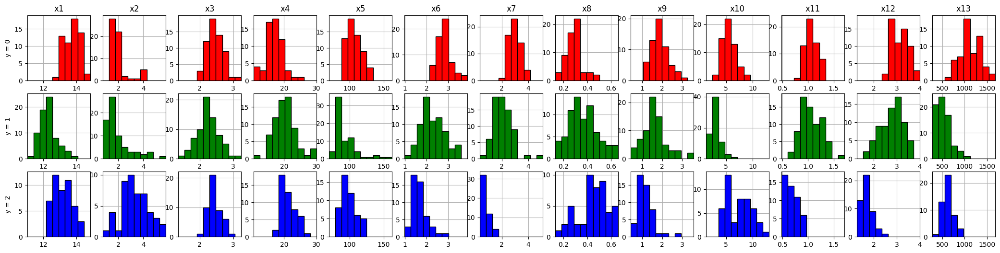

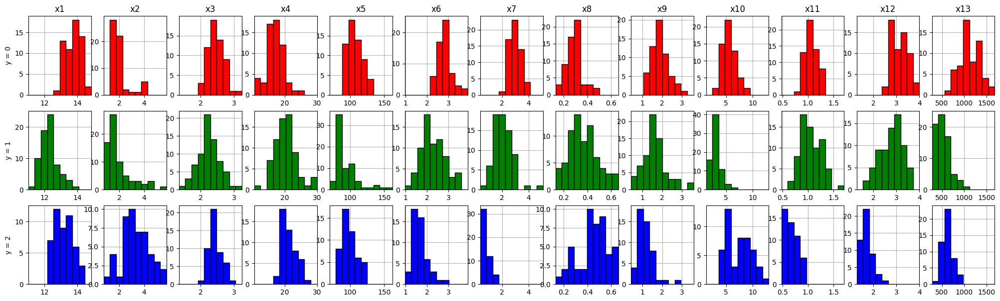

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets

X, y = datasets.load_wine(return_X_y=True)

num_features = X.shape[1]

plt.figure(figsize=(25, 7))

for k in range(num_features):
  plt.subplot(3,13,k+1)
  mk=np.min(X[:,k])
  Mk=np.max(X[:,k])
  binsk=np.linspace(mk,Mk,11)
  plt.hist(X[y==0,k],binsk,edgecolor='k',color='r',zorder=2)
  plt.title('x'+str(k+1))
  plt.grid()
  plt.xlim(mk,Mk)
  if k==0:
    plt.ylabel('y = 0')
  plt.subplot(3,13,k+14)
  plt.hist(X[y==1,k],binsk,edgecolor='k',color='g',zorder=2)
  plt.grid()
  plt.xlim(mk,Mk)
  if k==0:
    plt.ylabel('y = 1')
  plt.subplot(3,13,k+27)
  plt.hist(X[y==2,k],binsk,edgecolor='k',color='b',zorder=2)
  plt.grid()
  plt.xlim(mk,Mk)
  if k==0:
    plt.ylabel('y = 2')


Find coefficients to the formula

$$
[z_1,z_2,z_3]=[\widehat{x}_1,\widehat{x}_2,...,\widehat{x}_{13}]@\left[
\begin{array}{ccc}
w_{11}&w_{12}&w_{13}\\
w_{21}&w_{22}&w_{23}\\
\vdots&\vdots&\vdots\\
w_{13,1}&w_{13,2}&w_{13,3}
\end{array}
\right]+[b_1,b_2,b_3]
$$

to classify a wine $ x=[x_1,x_2,\dots,x_{13}]$ using the scaled coordinates  (means $= 0$ and standard deviations $= 1$), and draw a picture like below.



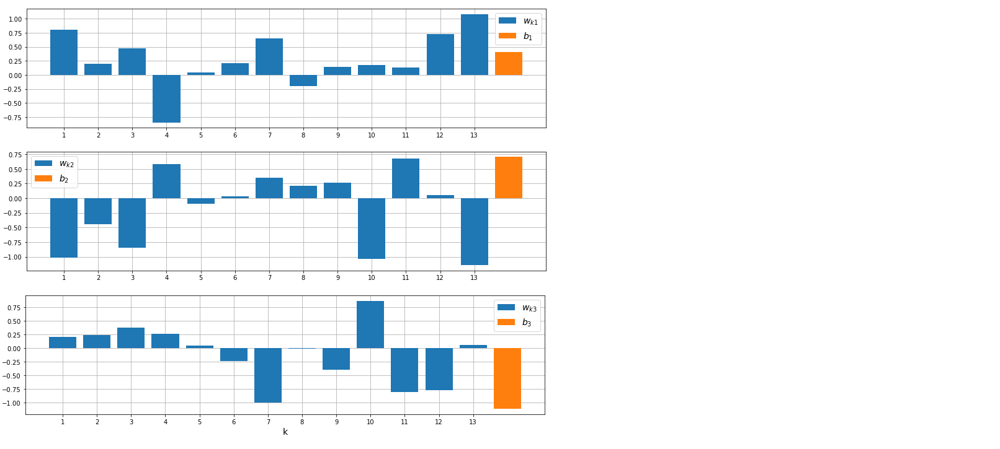

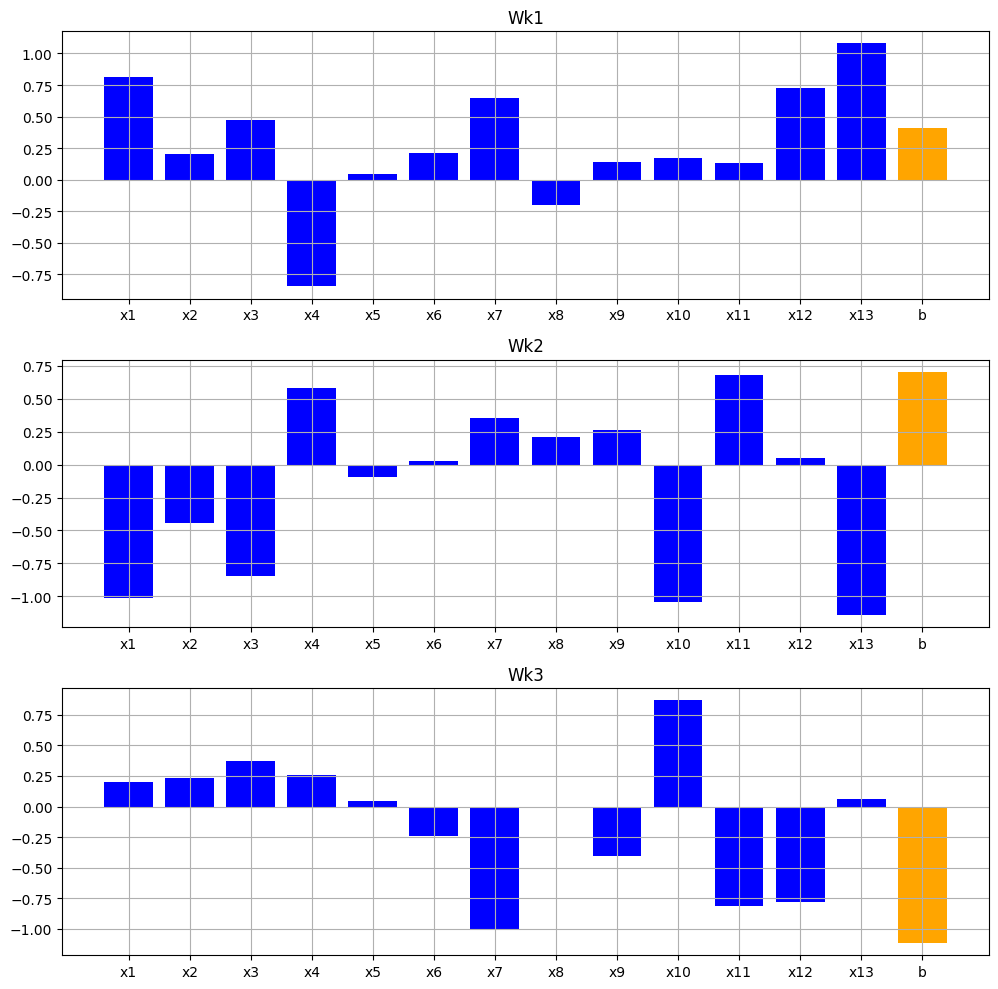

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

X, y = datasets.load_wine(return_X_y=True)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = LogisticRegression()
model.fit(X_scaled, y)

coefficients = model.coef_
intercepts = model.intercept_

coefficients_class_0 = coefficients[0]
coefficients_class_1 = coefficients[1]
coefficients_class_2 = coefficients[2]

intercept_class_0 = intercepts[0]
intercept_class_1 = intercepts[1]
intercept_class_2 = intercepts[2]

coefficients_with_intercept = np.column_stack((coefficients, intercepts))

num_features = len(coefficients_class_0)
num_features_with_intercept = coefficients_with_intercept.shape[1]


colors = ['orange' if i == num_features_with_intercept - 1 else 'blue' for i in range(num_features_with_intercept)]

#subplots
plt.figure(figsize=(10, 10))
for i, (coefficients_class, class_label) in enumerate(zip(coefficients_with_intercept, ['Wk1', 'Wk2', 'Wk3']), 1):
    plt.subplot(3 ,1, i)
    plt.bar(np.arange(num_features_with_intercept), coefficients_class, color=colors)

    plt.title(class_label)
    plt.xticks(np.arange(num_features_with_intercept), [f'x{i+1}' if i < num_features else 'b' for i in range(num_features_with_intercept)])
    plt.grid(True)

plt.tight_layout()
plt.show()


Create the  confusion matrix

ans: $\left[\begin{array}{ccc}
59&0&0\\0&71&0\\0&0&48
\end{array}\right]$

and classify the wine

$x=[13.0,2.34,2.36,19.5,99.7,2.29,2.03,0.36,1.59,5.1,0.96,2.61,746]$

(ans: $y=1$)

In [23]:
from sklearn.metrics import confusion_matrix
x_point = [13.0, 2.34, 2.36, 19.5, 99.7, 2.29, 2.03, 0.36, 1.59, 5.1, 0.96, 2.61, 746]

x_point_scaled = scaler.transform([x_point])

predicted_class = model.predict(x_point_scaled)
print("Predicted Class:", predicted_class[0])

y_pred = model.predict(X_scaled)
conf_matrix = confusion_matrix(y, y_pred)
print("Confusion Matrix:")
print(conf_matrix)


Predicted Class: 1
Confusion Matrix:
[[59  0  0]
 [ 0 71  0]
 [ 0  0 48]]


## **Exercise 3**










Use the points $x^{(i)}=[x_1^{(i)},x_2^{(i)}],\,y^{(i)}=0,1,$ given below to find coefficients $w_1,w_2,w_3,w_4,w_5$ and $b$ such that a point $x=[x_1,x_2]$ belongs to

class $y=1$, if
$z=w_1x_1^2+w_2x_1x_2+w_3x_2^2+w_4x_1+w_5x_2+b> 0$

class $y=0$, if $z<0$


using logistic regression for the datapoints

 $$[(x^{(i)}_1)^2,x^{(i)}_1x^{(i)}_2,(x^{(i)}_2)^2,x^{(i)}_1,x^{(i)}_2 ],\quad y^{(i)}$$

and draw a picture like below of the corresponding classification of 2D-points

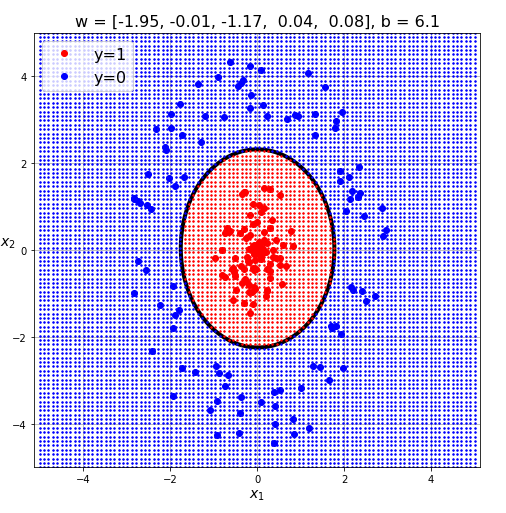

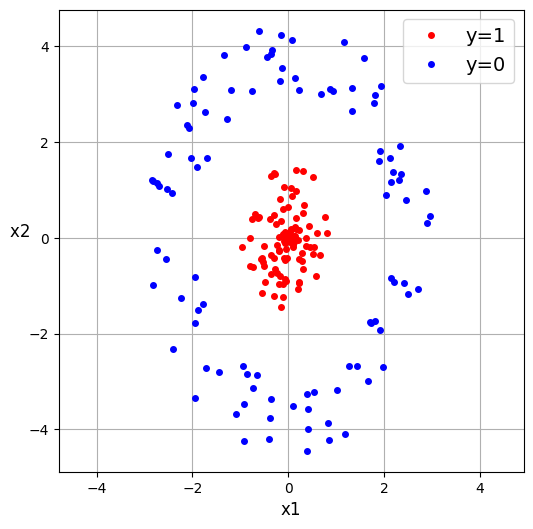

In [ ]:
#points
np.random.seed(0)

r1=np.random.rand(100)
th1=2*np.pi*np.random.rand(100)
x1pun=r1*np.cos(th1)
x2pun=1.5*r1*np.sin(th1)

r2=2+np.random.rand(100)
th2=2*np.pi*np.random.rand(100)
x1sin=r2*np.cos(th2)
x2sin=1.5*r2*np.sin(th2)


plt.figure(figsize=(6,6))
plt.plot(x1pun,x2pun,'r.',markersize=8,label='y=1')
plt.plot(x1sin,x2sin,'b.',markersize=8,label='y=0')
plt.grid()
plt.axis('equal')
plt.legend(fontsize=14)
plt.xlabel('x1',fontsize=12)
plt.ylabel('x2 ',rotation=0,fontsize=12)
plt.show()

Coefficients (w1, w2, w3, w4, w5): -1.9474213667294813 -0.010732844937399568 -1.169745561133911 0.043532605365048195 0.08253167624038935
Intercept (b): 6.071229912588919


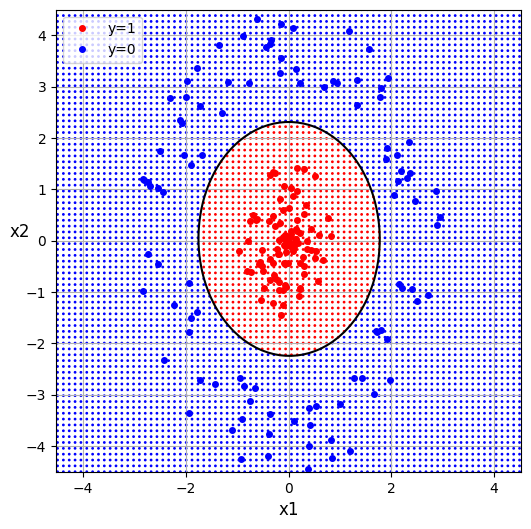

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

# Generate the data points
np.random.seed(0)

r1 = np.random.rand(100)
th1 = 2 * np.pi * np.random.rand(100)
x1pun = r1 * np.cos(th1)
x2pun = 1.5 * r1 * np.sin(th1)

r2 = 2 + np.random.rand(100)
th2 = 2 * np.pi * np.random.rand(100)
x1sin = r2 * np.cos(th2)
x2sin = 1.5 * r2 * np.sin(th2)


X_pun = np.column_stack((x1pun**2, x1pun * x2pun, x2pun**2, x1pun, x2pun))
X_sin = np.column_stack((x1sin**2, x1sin * x2sin, x2sin**2, x1sin, x2sin))

y_pun = np.ones(100)
y_sin = np.zeros(100)


X = np.vstack((X_pun, X_sin))
y = np.concatenate((y_pun, y_sin))


model = LogisticRegression()
model.fit(X, y)

w1, w2, w3, w4, w5 = model.coef_[0]
b = model.intercept_[0]


print("Coefficients (w1, w2, w3, w4, w5):", w1, w2, w3, w4, w5)
print("Intercept (b):", b)


plt.figure(figsize=(6,6))
plt.plot(x1pun, x2pun, 'r.', markersize=8, label='y=1')
plt.plot(x1sin, x2sin, 'b.', markersize=8, label='y=0')


x1_boundary = np.linspace(-4.5, 4.5, 80)
x2_boundary = np.linspace(-4.5, 4.5, 80)
x1_grid, x2_grid = np.meshgrid(x1_boundary, x2_boundary)
z = w1 * x1_grid**2 + w2 * x1_grid * x2_grid + w3 * x2_grid**2 + w4 * x1_grid + w5 * x2_grid + b
plt.contour(x1_grid, x2_grid, z, levels=[0], colors='black')


z_pred = model.predict(np.c_[x1_grid.ravel()**2, x1_grid.ravel()*x2_grid.ravel(), x2_grid.ravel()**2, x1_grid.ravel(), x2_grid.ravel()])
plt.scatter(x1_grid.ravel(), x2_grid.ravel(), c=z_pred, cmap='bwr', s=1, alpha=1)

plt.grid()
plt.axis('equal')
plt.legend(fontsize=10, loc='upper left')
plt.xlabel('x1', fontsize=12)
plt.ylabel('x2', rotation=0, fontsize=12)
plt.show()


# Neural networks


## **EXERCISE 1.**

Build and train a neural network that achieves 99.5 % classification accuracy for datapoints $x^{(i)}=[x_1^{(i)},x_2^{(i)}],\,y^{(i)}=0,1,2,3$, below.

Epoch 1/50
8/8 [==============================] - 2s 7ms/step - loss: 1.3793 - accuracy: 0.2463
Epoch 2/50
8/8 [==============================] - 0s 5ms/step - loss: 1.3610 - accuracy: 0.2675
Epoch 3/50
8/8 [==============================] - 0s 6ms/step - loss: 1.3439 - accuracy: 0.2537
Epoch 4/50
8/8 [==============================] - 0s 5ms/step - loss: 1.3260 - accuracy: 0.2438
Epoch 5/50
8/8 [==============================] - 0s 7ms/step - loss: 1.3069 - accuracy: 0.2512
Epoch 6/50
8/8 [==============================] - 0s 7ms/step - loss: 1.2793 - accuracy: 0.2725
Epoch 7/50
8/8 [==============================] - 0s 6ms/step - loss: 1.2572 - accuracy: 0.2912
Epoch 8/50
8/8 [==============================] - 0s 5ms/step - loss: 1.2214 - accuracy: 0.2988
Epoch 9/50
8/8 [==============================] - 0s 4ms/step - loss: 1.1904 - accuracy: 0.3212
Epoch 10/50
8/8 [==============================] - 0s 5ms/step - loss: 1.1546 - accuracy: 0.3575
Epoch 11/50
8/8 [======================

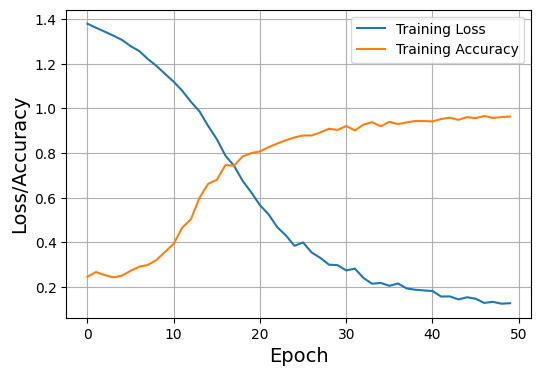

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
import numpy as np
import matplotlib.pyplot as plt

# Generate data
np.random.seed(0)
n = 200
m = 4 * n  # number of datapoints
th = np.linspace(0, 2*np.pi, n)
r = 0.15 + np.linspace(0, 1, n)
e = 0.02 * np.random.randn(n)

x11 = r * np.cos(-th) + e
x12 = r * np.sin(-th) + e
x11 = x11.reshape(n, 1)
x12 = x12.reshape(n, 1)

x21 = r * np.cos(np.pi / 2 - th) + e
x22 = r * np.sin(np.pi / 2 - th) + e
x21 = x21.reshape(n, 1)
x22 = x22.reshape(n, 1)

x31 = r * np.cos(np.pi - th) + e
x32 = r * np.sin(np.pi - th) + e
x31 = x31.reshape(n, 1)
x32 = x32.reshape(n, 1)

x41 = r * np.cos(3 * np.pi / 2 - th) + e
x42 = r * np.sin(3 * np.pi / 2 - th) + e
x41 = x41.reshape(n, 1)
x42 = x42.reshape(n, 1)

x1 = np.vstack([x11, x21, x31, x41])
x2 = np.vstack([x12, x22, x32, x42])
x = np.hstack([x1, x2])

y1 = np.ones(n)
y2 = 2 * np.ones(n)
y3 = 3 * np.ones(n)
y4 = 4 * np.ones(n)
y = np.hstack((y1, y2, y3, y4))
y_one = to_categorical(y - 1)  # Convert to one-hot encoding


#model
model = Sequential([
    Input(shape=(2,)),
    Dense(units=256, activation='relu'),
    Dropout(0.2),
    Dense(units=128, activation='relu'),
    Dropout(0.2),
    Dense(units=64, activation='relu'),
    Dense(units=4, activation='softmax'),

])

# Compile
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train
history = model.fit(x, y_one, batch_size=110, epochs=50 )

# Evaluate
test_loss, test_acc = model.evaluate(x, y_one)
print(f'Test Accuracy: {test_acc*100} %')

# Plot training history
plt.figure(figsize=(6, 4))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss/Accuracy', fontsize=14)
plt.legend()
plt.grid(True)
plt.show()


Calculate the confusion matrix

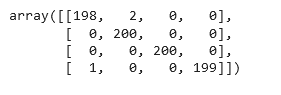

In [26]:
from sklearn.metrics import confusion_matrix

y_pred = np.argmax(model.predict(x), axis=1)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(np.argmax(y_one, axis=1), y_pred)

print("Confusion Matrix:")
print(conf_matrix)


25/25 [==============================] - 0s 1ms/step
Confusion Matrix:
[[200   0   0   0]
 [  0 200   0   0]
 [  0   2 198   0]
 [  0   0   0 200]]


and draw a picture like below of the resulting classification

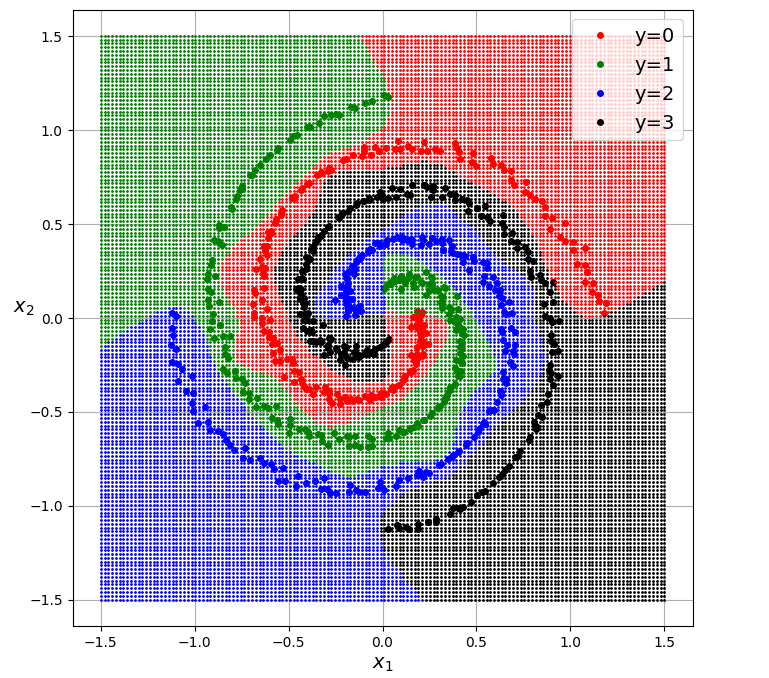

704/704 [==============================] - 1s 2ms/step


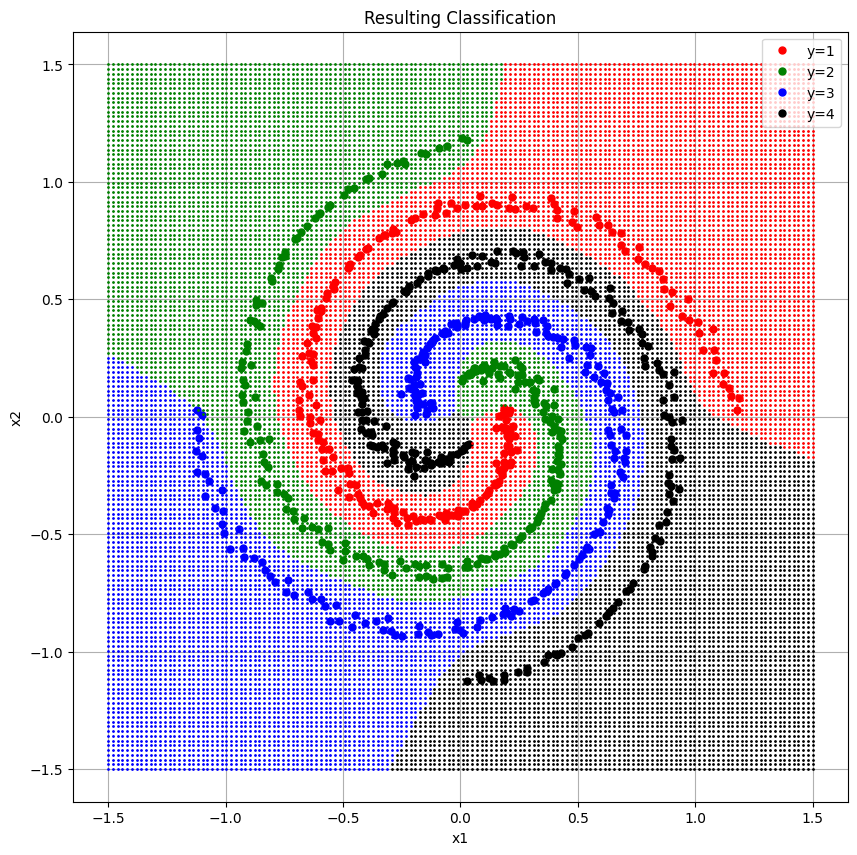

In [27]:
import matplotlib.pyplot as plt
M=150
x1=np.linspace(-1.5,1.5,M)
x2=np.linspace(-1.5,1.5,M)
x1,x2=np.meshgrid(x1,x2)

x1=x1.reshape((M*M,1))
x2=x2.reshape((M*M,1))
xx=np.hstack((x1,x2))

zz=model.predict(xx)
zz2=np.argmax(zz,axis=1)

plt.figure(figsize=(10, 10))
plt.plot(x[y==1,0],x[y==1,1],'ro',markersize=5,label='y=1')
plt.plot(x[y==2,0],x[y==2,1],'go',markersize=5,label='y=2')
plt.plot(x[y==3,0],x[y==3,1],'bo',markersize=5,label='y=3')
plt.plot(x[y==4,0],x[y==4,1],'ko',markersize=5,label='y=4')

plt.plot(x1[zz2==0,0],x2[zz2==0,0],'r.',markersize=2)
plt.plot(x1[zz2==1,0],x2[zz2==1,0],'g.',markersize=2)
plt.plot(x1[zz2==2,0],x2[zz2==2,0],'b.',markersize=2)
plt.plot(x1[zz2==3,0],x2[zz2==3,0],'k.',markersize=2)

plt.axis('equal')
plt.grid()
plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Resulting Classification')
plt.legend()
plt.show()



##**EXERCISE 2**

In [29]:
#load apple_quality.csv to colab
import pandas as pd
df=pd.read_csv('/content/apple_quality.csv',index_col=0)
df.head() #first 5 rows

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
A_id,,,,,,,,
0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590,good
1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809,good
2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636,bad
3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723,good
4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984,good


Goal: to predict Quality using the other 7 variables Size ... Acidity

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4000 entries, 0 to 3999
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Size         4000 non-null   float64
 1   Weight       4000 non-null   float64
 2   Sweetness    4000 non-null   float64
 3   Crunchiness  4000 non-null   float64
 4   Juiciness    4000 non-null   float64
 5   Ripeness     4000 non-null   float64
 6   Acidity      4000 non-null   float64
 7   Quality      4000 non-null   object 
dtypes: float64(7), object(1)
memory usage: 281.2+ KB


Split datapoints to training and test (70%/30%), and build and train a neural network that achieves 93% classification accuracy for test data, and calculate the confusion matrix.

In [31]:
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
from sklearn.metrics import confusion_matrix

df = pd.read_csv('/content/apple_quality.csv', index_col=0)

df['Quality'].replace(df['Quality'].unique(),[1,0],inplace=True)

X=np.array(df.iloc[:,:7])
y=np.array(df['Quality'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

mu = np.mean(X_train, axis=0)
s = np.std(X_train, axis=0)
X_train_std = (X_train - mu) / s
X_test_std = (X_test - mu) / s

# Define the model
model = Sequential([
    Input(shape=(7,)),
    Dense(units=256, activation='relu'),
    Dense(units=128, activation='relu'),
    Dense(units=64, activation='relu'),
    Dense(units=1, activation='sigmoid'),
])

# Compile
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

#Checkpoint callback
callback = ModelCheckpoint(
    filepath='apple_model.hdf5',
    monitor='val_accuracy',
    mode='max',
    save_weights_only=True,
    save_best_only=True,
    verbose=1
)

# Train
history = model.fit(X_train_std, y_train, epochs=400, batch_size=64, validation_data=(X_test_std, y_test), callbacks=[callback])

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')
model.load_weights('apple_model.hdf5')
atest_pred=model.predict(X_test_std)[:,0]
mtest=y_test.shape[0]
ytest_pred=np.zeros(mtest)
ytest_pred[atest_pred>=0.5]=1

confusion_matrix(y_test,ytest_pred)


Epoch 1/400
44/44 [==============================] - ETA: 0s - loss: 0.4583 - accuracy: 0.7964
Epoch 1: val_accuracy improved from -inf to 0.84083, saving model to apple_model.hdf5
44/44 [==============================] - 1s 10ms/step - loss: 0.4583 - accuracy: 0.7964 - val_loss: 0.3481 - val_accuracy: 0.8408
Epoch 2/400
40/44 [==========================>...] - ETA: 0s - loss: 0.3046 - accuracy: 0.8648
Epoch 2: val_accuracy improved from 0.84083 to 0.85833, saving model to apple_model.hdf5
44/44 [==============================] - 0s 8ms/step - loss: 0.3023 - accuracy: 0.8636 - val_loss: 0.3032 - val_accuracy: 0.8583
Epoch 3/400
38/44 [========================>.....] - ETA: 0s - loss: 0.2740 - accuracy: 0.8775
Epoch 3: val_accuracy improved from 0.85833 to 0.86833, saving model to apple_model.hdf5
44/44 [==============================] - 0s 8ms/step - loss: 0.2710 - accuracy: 0.8789 - val_loss: 0.2817 - val_accuracy: 0.8683
Epoch 4/400
41/44 [==========================>...] - ETA: 0s - 

array([[560,  33],
       [ 30, 577]])

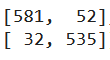

Classify the apple
xt=[ 1.34470668, -0.08934453, -4.50875321,  0.59093255, -3.98352604,
        1.50052136, -0.28032534]

(ans. bad)        

In [32]:

xt_std = (np.array([1.34470668, -0.08934453, -4.50875321, 0.59093255, -3.98352604, 1.50052136, -0.28032534]) - mu) / s

# Predict the quality of the apple
prediction = model.predict(np.expand_dims(xt_std, axis=0))[0][0]

if prediction >= 0.5:
    print("The predicted quality of the apple is: Good")
else:
    print("The predicted quality of the apple is: Bad")


1/1 [==============================] - 0s 16ms/step
The predicted quality of the apple is: Bad


## **EXERCISE 3**

In [34]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/Dry_Bean_Dataset.csv')


In [35]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [36]:
df['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [37]:
X_train_std.shape

(2800, 7)

Goal: to predict the class using the other variables.


Split datapoints to training and test (70%/30%), and build and train a neural network that achieves 93% classification accuracy for test data, and calculate the confusion matrix.

In [38]:
print("Dataset shape:", df.shape)



Dataset shape: (13611, 17)


In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from keras.optimizers import Adam

df = pd.read_csv('/content/Dry_Bean_Dataset.csv')


label_encoder = LabelEncoder()
df['Class'] = label_encoder.fit_transform(df['Class'])


X = df.drop(columns=['Class']).values
y = df['Class'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)


print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

mu = np.mean(X_train, axis=0)
s = np.std(X_train, axis=0)

X_train_hat = (X_train - mu) / s
X_test_hat = (X_test - mu) / s

# Define
model = Sequential([
    Input(shape=(16,)),
    Dense(units=256, activation='relu'),
    Dense(units=128, activation='relu'),
    Dense(units=64, activation='relu'),
    Dense(units=7, activation='sigmoid'),
])

# Compile
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


checkpoint_callback = ModelCheckpoint(
    filepath='beans_model.hdf5',
    monitor='val_accuracy',
    mode='max',
    save_weights_only=True,
    save_best_only=True,
    verbose=1
)

# Train
history = model.fit(X_train_hat, y_train, epochs=100, batch_size=1000, validation_data=(X_test_hat, y_test), callbacks=[checkpoint_callback])

model.load_weights('beans_model.hdf5')

# Evaluate
test_loss, test_accuracy = model.evaluate(X_test_hat, y_test)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')


y_pred = np.argmax(model.predict(X_test_hat), axis=1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


X_train shape: (9527, 16)
y_train shape: (9527,)
X_test shape: (4084, 16)
y_test shape: (4084,)
Epoch 1/100
 9/10 [==========================>...] - ETA: 0s - loss: 1.5809 - accuracy: 0.5828
Epoch 1: val_accuracy improved from -inf to 0.74021, saving model to beans_model.hdf5
10/10 [==============================] - 5s 136ms/step - loss: 1.5604 - accuracy: 0.5891 - val_loss: 1.1345 - val_accuracy: 0.7402
Epoch 2/100
 9/10 [==========================>...] - ETA: 0s - loss: 0.8748 - accuracy: 0.7788
Epoch 2: val_accuracy improved from 0.74021 to 0.83937, saving model to beans_model.hdf5
10/10 [==============================] - 0s 43ms/step - loss: 0.8610 - accuracy: 0.7815 - val_loss: 0.5932 - val_accuracy: 0.8394
Epoch 3/100
 8/10 [=======================>......] - ETA: 0s - loss: 0.4823 - accuracy: 0.8711
Epoch 3: val_accuracy improved from 0.83937 to 0.88124, saving model to beans_model.hdf5
10/10 [==============================] - 0s 43ms/step - loss: 0.4627 - accuracy: 0.8741 - val_

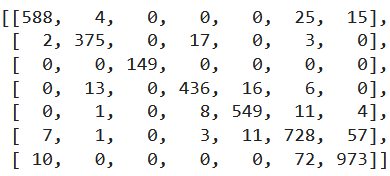

Classify the dry bean

xt=[29817        ,   654.94      ,   249.9393798 ,   153.5127658 ,
           1.62813417,     0.78915041, 30306        ,   194.8439979 ,
           0.76110374,     0.98386458,     0.87351583,     0.77956502,
           0.00838245,     0.00190968,     0.60772162,     0.98945234]

(ans. dermason)           

In [40]:
# Make predictions
y_pred = np.argmax(model.predict(X_test_hat), axis=1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)
total_samples = np.sum(conf_matrix)
print("Total samples processed and classified:", total_samples)


128/128 [==============================] - 0s 2ms/step
Confusion Matrix:
 [[373   0  15   0   1   4   9]
 [  2 146   0   0   0   0   0]
 [ 16   0 481   0   6   2   5]
 [  0   0   0 950   1  23  52]
 [  1   0   9   4 585   0  13]
 [  4   0   0   4   0 587   8]
 [  3   0   1  72  10  18 679]]
Total samples processed and classified: 4084


In [41]:

xt = np.array([29817 , 654.94 , 249.9393798 , 153.5127658 , 1.62813417, 0.78915041, 30306 , 194.8439979 , 0.76110374, 0.98386458, 0.87351583, 0.77956502, 0.00838245, 0.00190968, 0.60772162, 0.98945234])
xt_std = (xt - mu) / s

predicted_probabilities = model.predict(xt_std.reshape((1, 16)))

predicted_class_index = np.argmax(predicted_probabilities)

class_labels = label_encoder.classes_
predicted_label = class_labels[predicted_class_index]

print("Predicted class:", predicted_label)


1/1 [==============================] - 0s 18ms/step
Predicted class: DERMASON


##**EXERCISE 4**



[Reuters newswire classification dataset](https://keras.io/api/datasets/reuters/)


This is a dataset of 11,228 newswires from Reuters, labeled over 46 topics.

['cocoa','grain','veg-oil','earn','acq','wheat','copper','housing','money-supply',
   'coffee','sugar','trade','reserves','ship','cotton','carcass','crude','nat-gas',
   'cpi','money-fx','interest','gnp','meal-feed','alum','oilseed','gold','tin',
   'strategic-metal','livestock','retail','ipi','iron-steel','rubber','heat','jobs',
   'lei','bop','zinc','orange','pet-chem','dlr','gas','silver','wpi','hog','lead']

Each newswire is encoded as a list of word indexes (integers). For convenience, words are indexed by overall frequency in the dataset, so that for instance the integer "3" encodes the 3rd most frequent word in the data.



Build and train a neural network that achieves 80% classification accuracy for test data

In [ ]:
from tensorflow import keras
from keras.datasets import reuters

In [ ]:
# Use the default parameters to keras.datasets.imdb.load_data
start_char = 1
oov_char = 2
index_from = 3

num_words=1000

(x_train, y_train), (x_test, y_test) = keras.datasets.reuters.load_data(
    start_char=start_char, oov_char=oov_char, index_from=index_from, num_words=num_words)

In [ ]:
print(len(x_train))
print(len(x_test))

8982
2246


In [ ]:
x_train[0]

[1,
 2,
 2,
 8,
 43,
 10,
 447,
 5,
 25,
 207,
 270,
 5,
 2,
 111,
 16,
 369,
 186,
 90,
 67,
 7,
 89,
 5,
 19,
 102,
 6,
 19,
 124,
 15,
 90,
 67,
 84,
 22,
 482,
 26,
 7,
 48,
 4,
 49,
 8,
 864,
 39,
 209,
 154,
 6,
 151,
 6,
 83,
 11,
 15,
 22,
 155,
 11,
 15,
 7,
 48,
 9,
 2,
 2,
 504,
 6,
 258,
 6,
 272,
 11,
 15,
 22,
 134,
 44,
 11,
 15,
 16,
 8,
 197,
 2,
 90,
 67,
 52,
 29,
 209,
 30,
 32,
 132,
 6,
 109,
 15,
 17,
 12]

In [ ]:
len(x_train[0])

87

In [ ]:
y_train[0]

3

In [ ]:
print(min(y_train))
print(max(y_train))

0
45


In [ ]:
print(min(len(x_train[k]) for k in range(8982)))
print(max(len(x_train[k]) for k in range(8982)))

13
2376


In [ ]:
max(max(x_train))

990

In [ ]:

word_index = keras.datasets.reuters.get_word_index()

550378/550378 [==============================] - 0s 1us/step


In [ ]:
word_index

{'mdbl': 10996,
 'fawc': 16260,
 'degussa': 12089,
 'woods': 8803,
 'hanging': 13796,
 'localized': 20672,
 'sation': 20673,
 'chanthaburi': 20675,
 'refunding': 10997,
 'hermann': 8804,
 'passsengers': 20676,
 'stipulate': 20677,
 'heublein': 8352,
 'screaming': 20713,
 'tcby': 16261,
 'four': 185,
 'grains': 1642,
 'broiler': 20680,
 'wooden': 12090,
 'wednesday': 1220,
 'highveld': 13797,
 'duffour': 7593,
 '0053': 20681,
 'elections': 3914,
 '270': 2563,
 '271': 3551,
 '272': 5113,
 '273': 3552,
 '274': 3400,
 'rudman': 7975,
 '276': 3401,
 '277': 3478,
 '278': 3632,
 '279': 4309,
 'dormancy': 9381,
 'errors': 7247,
 'deferred': 3086,
 'sptnd': 20683,
 'cooking': 8805,
 'stratabit': 20684,
 'designing': 16262,
 'metalurgicos': 20685,
 'databank': 13798,
 '300er': 20686,
 'shocks': 20687,
 'nawg': 7972,
 'tnta': 20688,
 'perforations': 20689,
 'affiliates': 2891,
 '27p': 20690,
 'ching': 16263,
 'china': 595,
 'wagyu': 16264,
 'affiliated': 3189,
 'chino': 16265,
 'chinh': 16266,
 '

In [ ]:

words = list(word_index.keys())
indices = list(word_index.values())
print(words[0:10]) #10 first words
print(indices[0:10]) #10 first indices

#10 most common words
for k in range(10):
  ind=indices.index(k+1)
  print(words[ind])

['mdbl', 'fawc', 'degussa', 'woods', 'hanging', 'localized', 'sation', 'chanthaburi', 'refunding', 'hermann']
[10996, 16260, 12089, 8803, 13796, 20672, 20673, 20675, 10997, 8804]
the
of
to
in
said
and
a
mln
3
for


In [ ]:
# Reverse the word index to obtain a dict mapping indices to words
# And add index_from to indices to sync with x_train, x_test
inverted_word_index = dict(
    (i + index_from, word) for (word, i) in word_index.items()
)
# Update inverted_word_index to include start_char and oov_char
inverted_word_index[start_char] = "[start]"
inverted_word_index[oov_char] = "[oov]"


In [ ]:
inverted_word_index

{10999: 'mdbl',
 16263: 'fawc',
 12092: 'degussa',
 8806: 'woods',
 13799: 'hanging',
 20675: 'localized',
 20676: 'sation',
 20678: 'chanthaburi',
 11000: 'refunding',
 8807: 'hermann',
 20679: 'passsengers',
 20680: 'stipulate',
 8355: 'heublein',
 20716: 'screaming',
 16264: 'tcby',
 188: 'four',
 1645: 'grains',
 20683: 'broiler',
 12093: 'wooden',
 1223: 'wednesday',
 13800: 'highveld',
 7596: 'duffour',
 20684: '0053',
 3917: 'elections',
 2566: '270',
 3554: '271',
 5116: '272',
 3555: '273',
 3403: '274',
 7978: 'rudman',
 3404: '276',
 3481: '277',
 3635: '278',
 4312: '279',
 9384: 'dormancy',
 7250: 'errors',
 3089: 'deferred',
 20686: 'sptnd',
 8808: 'cooking',
 20687: 'stratabit',
 16265: 'designing',
 20688: 'metalurgicos',
 13801: 'databank',
 20689: '300er',
 20690: 'shocks',
 7975: 'nawg',
 20691: 'tnta',
 20692: 'perforations',
 2894: 'affiliates',
 20693: '27p',
 16266: 'ching',
 598: 'china',
 16267: 'wagyu',
 3192: 'affiliated',
 16268: 'chino',
 16269: 'chinh',
 2

In [ ]:
print(inverted_word_index[1])
print(inverted_word_index[2])
for k in range(4,14):
  print(inverted_word_index[k])


[start]
[oov]
the
of
to
in
said
and
a
mln
3
for


In [ ]:
# Decode review k in the train dataset
k=0
decoded_review = ' '.join(inverted_word_index[i] for i in x_train[k])

decoded_review

'[start] [oov] [oov] said as a result of its december acquisition of [oov] co it expects earnings per share in 1987 of 1 15 to 1 30 dlrs per share up from 70 cts in 1986 the company said pretax net should rise to nine to 10 mln dlrs from six mln dlrs in 1986 and [oov] [oov] revenues to 19 to 22 mln dlrs from 12 5 mln dlrs it said cash [oov] per share this year should be 2 50 to three dlrs reuter 3'

In [ ]:
y_train[k]

3

In [ ]:
import numpy as np
#One-hot encode your lists to turn them into vectors of 0s and 1s.
#This means, for instance, turning the sequence [3, 5] into a vector of length num_words
#that would be all 0s except for indices 3 and 5, which would be 1s
mtrain=len(x_train)
Xtrain=np.zeros((mtrain,num_words))
for k in range(mtrain):
  Xtrain[k,x_train[k]]=1

mtest=len(x_test)
Xtest=np.zeros((mtest,num_words))
for k in range(mtest):
  Xtest[k,x_test[k]]=1

In [ ]:
Xtrain[0]

array([0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 1., 1.,
       1., 0., 1., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0., 1., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.,
       0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [ ]:
Xtrain.shape

(8982, 1000)

In [ ]:
y_train

array([ 3,  4,  3, ..., 25,  3, 25])

In [ ]:
#You should also vectorize your labels, which is straightforward
ytrain = np.array(y_train).astype('float32')
ytest = np.array(y_test).astype('float32')


In [ ]:
ytrain

array([ 3.,  4.,  3., ..., 25.,  3., 25.], dtype=float32)

In [ ]:
from keras.models import Sequential
from keras.layers import Input, Dropout, Dense
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint


N = 100
model = Sequential([
    Input(shape=(num_words,)),
    Dropout(rate=0.2),
    Dense(N, activation='relu'),
    Dropout(rate=0.2),
    Dense(46, activation='softmax')  # 46 classes for Reuters dataset
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Define ModelCheckpoint callback
callback = ModelCheckpoint(
    filepath='reuters_model.hdf5',
    monitor='val_accuracy',
    mode='max',
    save_weights_only=True,
    save_best_only=True,
    verbose=1
)

# Train the model
history = model.fit(Xtrain, ytrain,
                    epochs=100,
                    batch_size=1000,
                    validation_data=(Xtest, ytest),
                    callbacks=[callback])

Epoch 1/100
9/9 [==============================] - ETA: 0s - loss: 3.3268 - accuracy: 0.3192
Epoch 1: val_accuracy improved from -inf to 0.50134, saving model to reuters_model.hdf5
9/9 [==============================] - 1s 58ms/step - loss: 3.3268 - accuracy: 0.3192 - val_loss: 2.8501 - val_accuracy: 0.5013
Epoch 2/100
8/9 [=========================>....] - ETA: 0s - loss: 2.5869 - accuracy: 0.5236
Epoch 2: val_accuracy improved from 0.50134 to 0.57168, saving model to reuters_model.hdf5
9/9 [==============================] - 0s 39ms/step - loss: 2.5545 - accuracy: 0.5269 - val_loss: 2.2095 - val_accuracy: 0.5717
Epoch 3/100
9/9 [==============================] - ETA: 0s - loss: 2.0213 - accuracy: 0.5894
Epoch 3: val_accuracy improved from 0.57168 to 0.62066, saving model to reuters_model.hdf5
9/9 [==============================] - 0s 40ms/step - loss: 2.0213 - accuracy: 0.5894 - val_loss: 1.8231 - val_accuracy: 0.6207
Epoch 4/100
9/9 [==============================] - ETA: 0s - loss: 

In [ ]:
from keras.models import load_model
from google.colab import drive

# Load the Trained Model
model.load_weights('/content/reuters_model.hdf5')

# Evaluate the Model
test_loss, test_accuracy = model.evaluate(Xtest, ytest)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')


71/71 [==============================] - 0s 5ms/step - loss: 0.8508 - accuracy: 0.8054
Test Loss: 0.8507820963859558, Test Accuracy: 0.8054319024085999


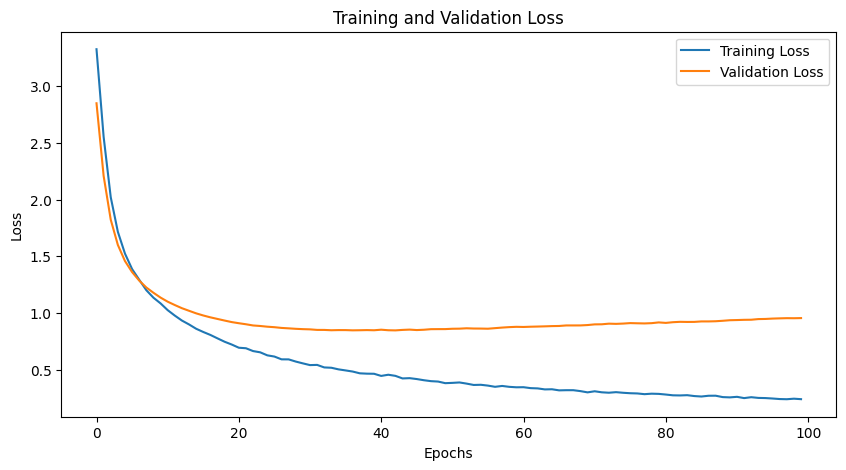

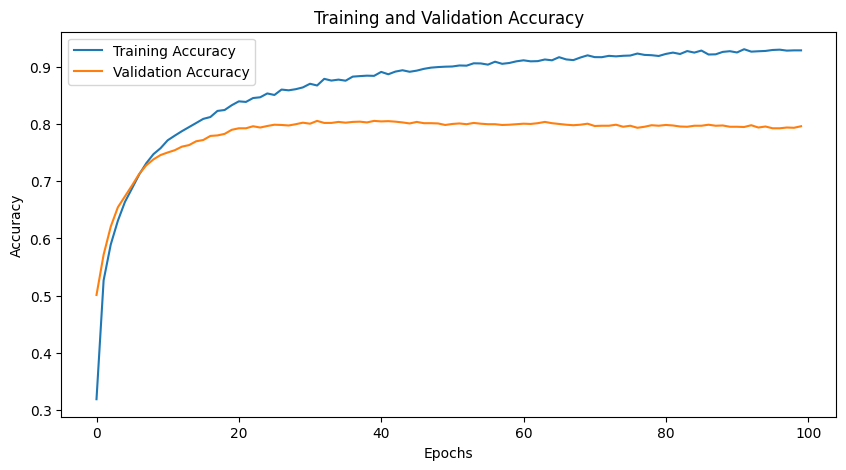

In [ ]:
import matplotlib.pyplot as plt


train_loss = history.history['loss']
val_loss = history.history['val_loss']


train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']


plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


## **EXERCISE 5**

[Sign-language-mnist-dataset](https://www.kaggle.com/datasets/datamunge/sign-language-mnist/code)

 28x28 bw-pictures of hand-gesture alphabets  A-Y (without J),
27455 training- and 7172 test.



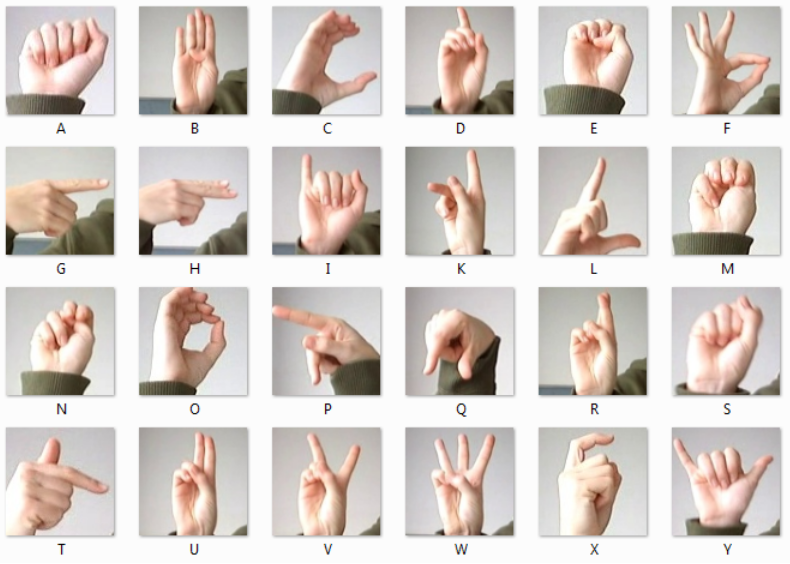







Build and train a neural network that achieves 80% classification accuracy for test-data.

Calculate the predictions for a random test-picture and draw a picture like below
(todennäköisyys = probability).




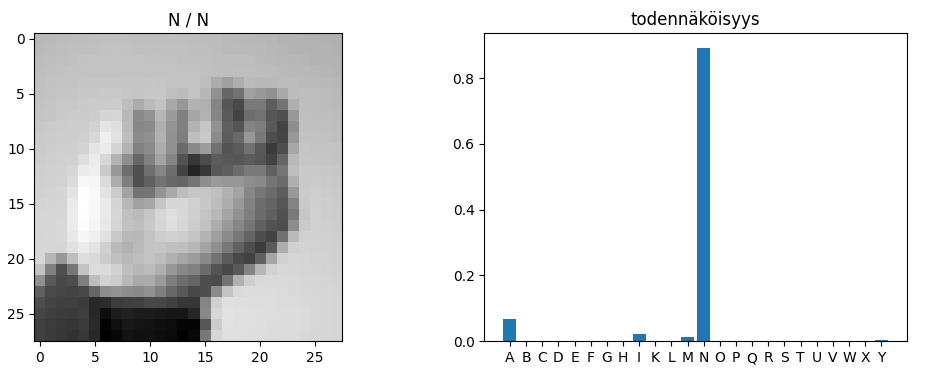

In [ ]:
#load sign_mnist_train.zip to drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#unzip to colab
!unzip '/content/drive/MyDrive/sign_mnist.zip' -d '/content'

Archive:  /content/drive/MyDrive/sign_mnist.zip
   creating: /content/sign_mnist/
  inflating: /content/sign_mnist/sign_mnist_test.csv  
  inflating: /content/sign_mnist/sign_mnist_train.csv  


In [ ]:
#read to np.array
train_data=np.loadtxt('sign_mnist/sign_mnist_train.csv',delimiter=',',skiprows=1)
test_data=np.loadtxt('sign_mnist/sign_mnist_test.csv',delimiter=',',skiprows=1)

In [ ]:
print(train_data.shape)
print(test_data.shape)

(27455, 785)
(7172, 785)


In [ ]:
xtrain=train_data[:,1:]/255.0 #pixel values to 0...1
ytrain=train_data[:,0] #classes
xtest=test_data[:,1:]/255.0
ytest=test_data[:,0]

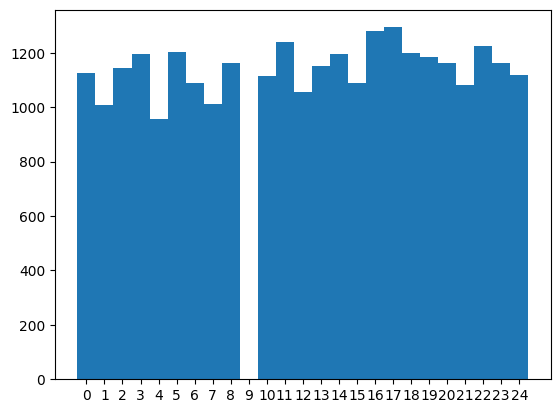

In [ ]:
#distribution of classes
plt.hist(ytrain,bins=np.arange(-0.5,25.5,1))
plt.xticks(np.arange(0,25,1))
plt.show()

In [ ]:
#class y=9 is missing (corresponds to J))
#decrease classes 10-24 by one
ytrain[ytrain>9]=ytrain[ytrain>9]-1
ytest[ytest>9]=ytest[ytest>9]-1

Y=['A','B','C','D','E','F','G','H','I','K','L','M',
   'N','O','P','Q','R','S','T','U','V','W','X','Y']

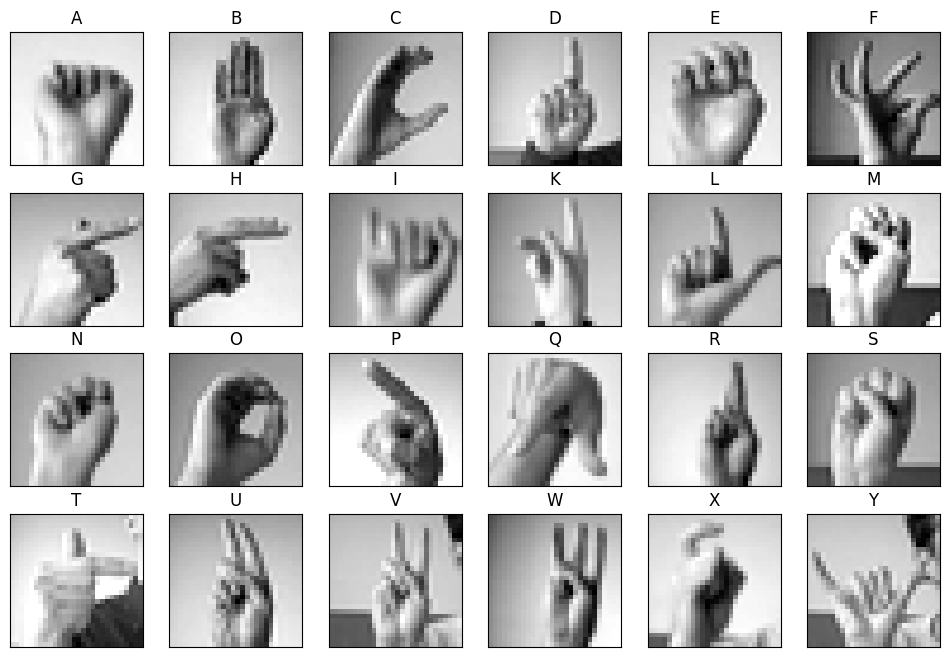

In [ ]:
#example pictures
plt.figure(figsize=(12,8))
for k in range(24):
    xtraink=xtrain[ytrain==k,:]
    mk,nk=xtraink.shape
    indk=np.random.randint(mk)
    kuvak=xtraink[indk,:].reshape((28,28))
    plt.subplot(4,6,k+1)
    plt.imshow(kuvak, cmap='gray')
    plt.xticks([],[])
    plt.yticks([],[])
    plt.title(Y[k])

Epoch 1/20
387/387 [==============================] - 27s 60ms/step - loss: 1.2339 - accuracy: 0.6395 - val_loss: 0.3399 - val_accuracy: 0.9028
Epoch 2/20
387/387 [==============================] - 20s 51ms/step - loss: 0.1360 - accuracy: 0.9669 - val_loss: 0.0416 - val_accuracy: 0.9949
Epoch 3/20
387/387 [==============================] - 24s 61ms/step - loss: 0.0231 - accuracy: 0.9984 - val_loss: 0.0128 - val_accuracy: 0.9996
Epoch 4/20
387/387 [==============================] - 21s 53ms/step - loss: 0.0075 - accuracy: 0.9999 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 5/20
387/387 [==============================] - 20s 51ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 6/20
387/387 [==============================] - 21s 55ms/step - loss: 0.0298 - accuracy: 0.9904 - val_loss: 0.0086 - val_accuracy: 0.9996
Epoch 7/20
387/387 [==============================] - 21s 54ms/step - loss: 0.0028 - accuracy: 0.9998 - val_loss: 9.6056e-04 - val_accur

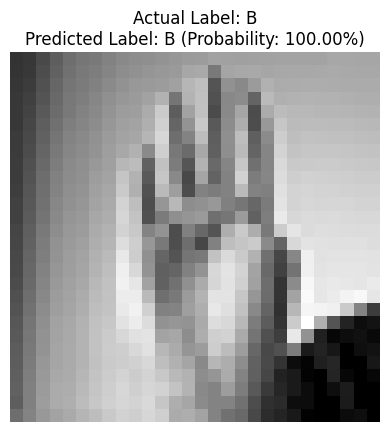

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.utils import to_categorical

# Reshape
xtrain_reshaped = xtrain.reshape((-1, 28, 28, 1))
xtest_reshaped = xtest.reshape((-1, 28, 28, 1))


ytrain_onehot = to_categorical(ytrain, num_classes=24)
ytest_onehot = to_categorical(ytest, num_classes=24)


x_train, x_val, y_train, y_val = train_test_split(xtrain_reshaped, ytrain_onehot, test_size=0.1, random_state=42)

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(24, activation='softmax')
])

# Compile
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train
history = model.fit(x_train, y_train, epochs=20, batch_size=64, validation_data=(x_val, y_val))

# Evaluate
test_loss, test_accuracy = model.evaluate(xtest_reshaped, ytest_onehot)
print(f'Test Accuracy: {test_accuracy*100:.2f}%')

random_index = np.random.randint(len(xtest_reshaped))
random_image = xtest_reshaped[random_index]
random_label = Y[int(ytest[random_index])]
prediction = model.predict(random_image.reshape(1, 28, 28, 1))
predicted_label = Y[np.argmax(prediction)]

plt.imshow(random_image.squeeze(), cmap='gray')
plt.title(f'Actual Label: {random_label}\nPredicted Label: {predicted_label} (Probability: {np.max(prediction)*100:.2f}%)')
plt.axis('off')
plt.show()


1/1 [==============================] - 0s 20ms/step


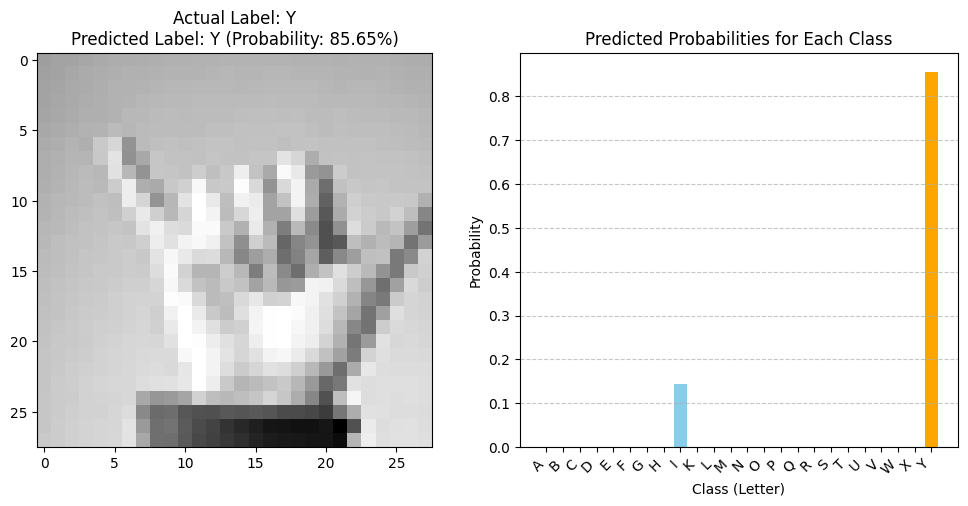

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Choose a different random
random_index = np.random.randint(len(xtest_reshaped))


random_image = xtest_reshaped[random_index]
random_label = Y[int(ytest[random_index])]

# Predict the label
prediction = model.predict(random_image.reshape(1, 28, 28, 1))
predicted_label = Y[np.argmax(prediction)]
predicted_probabilities = prediction.squeeze()


plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(random_image.squeeze(), cmap='gray')
plt.title(f'Actual Label: {random_label}\nPredicted Label: {predicted_label} (Probability: {np.max(prediction)*100:.2f}%)')
plt.subplot(1, 2, 2)
plt.bar(Y, predicted_probabilities, color='skyblue')
plt.bar(predicted_label, max(predicted_probabilities), color='orange')
plt.xlabel('Class (Letter)')
plt.ylabel('Probability')
plt.title('Predicted Probabilities for Each Class')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


##**EXERCISE 6**

In [ ]:
#load ex6_data.csv to colab
df=pd.read_csv('ex6_data.csv')
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

In [ ]:
#remove column Market Category (contains only 8172 values)
df.drop(columns='Market Category',inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Vehicle Size       11914 non-null  object 
 10  Vehicle Style      11914 non-null  object 
 11  highway MPG        11914 non-null  int64  
 12  city mpg           11914 non-null  int64  
 13  Popularity         11914 non-null  int64  
 14  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5), object(7)
memory usage: 1.4+ MB


In [ ]:
#remove rows with missing values
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11812 entries, 0 to 11913
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11812 non-null  object 
 1   Model              11812 non-null  object 
 2   Year               11812 non-null  int64  
 3   Engine Fuel Type   11812 non-null  object 
 4   Engine HP          11812 non-null  float64
 5   Engine Cylinders   11812 non-null  float64
 6   Transmission Type  11812 non-null  object 
 7   Driven_Wheels      11812 non-null  object 
 8   Number of Doors    11812 non-null  float64
 9   Vehicle Size       11812 non-null  object 
 10  Vehicle Style      11812 non-null  object 
 11  highway MPG        11812 non-null  int64  
 12  city mpg           11812 non-null  int64  
 13  Popularity         11812 non-null  int64  
 14  MSRP               11812 non-null  int64  
dtypes: float64(3), int64(5), object(7)
memory usage: 1.4+ MB


Use Models that have at least 10 representatives and datapoints whose MSRP  $\le$ 100000.

Split datapoints to training and test (70%/30%),
and build and train a neural network to predict the value  $y$ = MSRP using the other variables such that test mae is $\le$ 2750.

Draw pictures like below

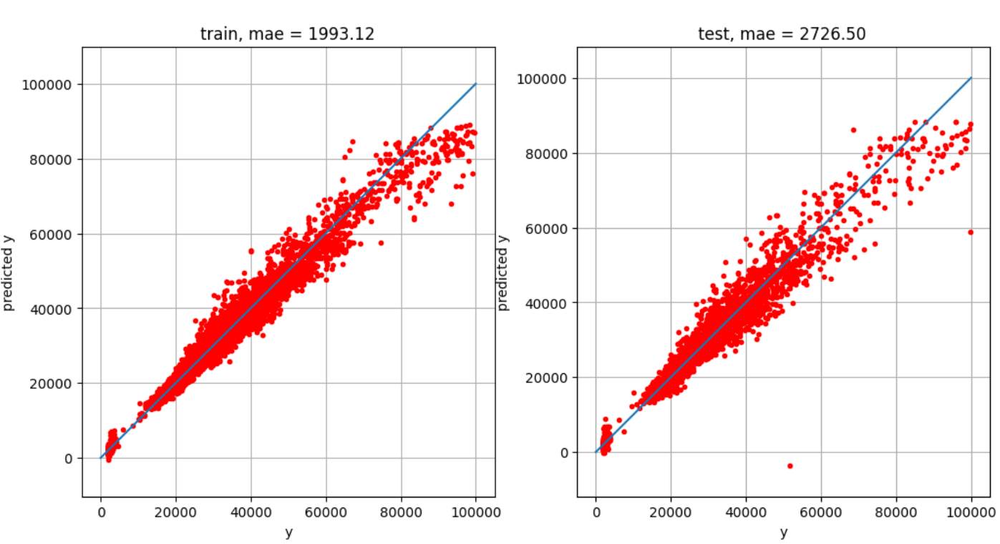

Shape of X_train: (6369, 474)
Shape of X_test: (2730, 474)
Shape of X_train after conversion: (6369, 474)
Shape of X_test after conversion: (2730, 474)
Epoch 1/100
200/200 [==============================] - 2s 4ms/step - loss: 28914.0352 - mae: 28914.0352 - val_loss: 20508.9531 - val_mae: 20508.9531
Epoch 2/100
200/200 [==============================] - 1s 4ms/step - loss: 9800.3438 - mae: 9800.3438 - val_loss: 5880.5991 - val_mae: 5880.5991
Epoch 3/100
200/200 [==============================] - 1s 4ms/step - loss: 6678.3101 - mae: 6678.3101 - val_loss: 5037.4844 - val_mae: 5037.4844
Epoch 4/100
200/200 [==============================] - 1s 4ms/step - loss: 6203.5176 - mae: 6203.5176 - val_loss: 4587.5112 - val_mae: 4587.5112
Epoch 5/100
200/200 [==============================] - 1s 4ms/step - loss: 5938.7026 - mae: 5938.7026 - val_loss: 4264.8281 - val_mae: 4264.8281
Epoch 6/100
200/200 [==============================] - 1s 4ms/step - loss: 5581.7700 - mae: 5581.7700 - val_loss: 4015.

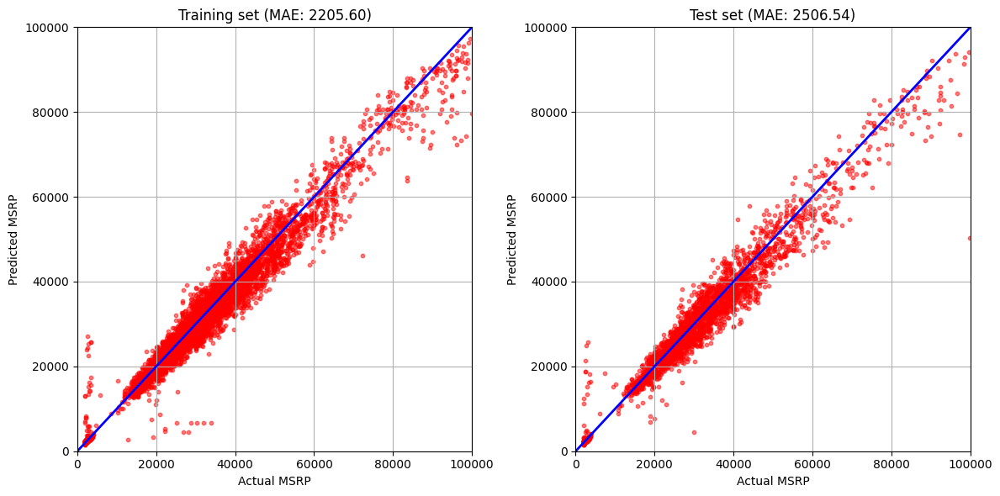

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam

# Load the data
df = pd.read_csv('/content/ex6_data.csv')

# Drop the 'Market Category' column
df.drop(columns='Market Category', inplace=True)

# Remove rows with missing values
df.dropna(inplace=True)

# Filter models with at least 10 representatives
model_counts = df['Model'].value_counts()
df = df[df['Model'].isin(model_counts[model_counts >= 10].index)]

# Filter datapoints with MSRP <= 100000
df = df[df['MSRP'] <= 100000]

# Split the data into features and target variable
X = df.drop(columns='MSRP')
y = df['MSRP']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

numeric_features = ['Year', 'Engine HP', 'Engine Cylinders', 'Number of Doors', 'highway MPG', 'city mpg', 'Popularity']
categorical_features = ['Make', 'Model', 'Engine Fuel Type', 'Transmission Type', 'Driven_Wheels', 'Vehicle Size', 'Vehicle Style']

numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])


X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)


print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")


X_train = X_train.toarray() if hasattr(X_train, "toarray") else X_train
X_test = X_test.toarray() if hasattr(X_test, "toarray") else X_test


print(f"Shape of X_train after conversion: {X_train.shape}")
print(f"Shape of X_test after conversion: {X_test.shape}")

# Define
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_absolute_error', metrics=['mae'])

# Train
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate
train_mae = model.evaluate(X_train, y_train, verbose=0)[1]
test_mae = model.evaluate(X_test, y_test, verbose=0)[1]

# Predict MSRP
y_pred = model.predict(X_test)


plt.figure(figsize=(12, 6))

# Training plot
plt.subplot(1, 2, 1)
plt.scatter(y_train, model.predict(X_train), color='red', s=10, alpha=0.5)
plt.plot([0, 100000], [0, 100000], color='blue', linewidth=2)
plt.xlabel('Actual MSRP')
plt.ylabel('Predicted MSRP')
plt.title(f'Training set (MAE: {model.evaluate(X_train, y_train, verbose=0)[1]:.2f})')
plt.xlim(0, 100000)
plt.ylim(0, 100000)
plt.grid(True)

# Test plot
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred, color='red', s=10, alpha=0.5)
plt.plot([0, 100000], [0, 100000], color='blue', linewidth=2)
plt.xlabel('Actual MSRP')
plt.ylabel('Predicted MSRP')
plt.title(f'Test set (MAE: {test_mae:.2f})')
plt.xlim(0, 100000)
plt.ylim(0, 100000)
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
#test
new_data = pd.DataFrame([{
    'Make': 'BMW',
    'Model': '1 Series',
    'Year': 2012,
    'Engine Fuel Type': 'premium unleaded (required)',
    'Engine HP': 300,
    'Engine Cylinders': 6,
    'Transmission Type': 'MANUAL',
    'Driven_Wheels': 'rear wheel drive',
    'Number of Doors': 2,
    'Vehicle Size': 'Compact',
    'Vehicle Style': 'Coupe',
    'highway MPG': 28,
    'city mpg': 20,
    'Popularity': 3916
}])

new_data_preprocessed = preprocessor.transform(new_data)

new_data_preprocessed = new_data_preprocessed.toarray() if hasattr(new_data_preprocessed, "toarray") else new_data_preprocessed

new_data_pred = model.predict(new_data_preprocessed)

print(f"Predicted MSRP for the new data point: ${new_data_pred[0][0]:.2f}")

1/1 [==============================] - 0s 35ms/step
Predicted MSRP for the new data point: $36952.34


# Convolutional neural networks


## **EXERCISE 1**

[Kaggles sign-language-mnist-dataset](https://www.kaggle.com/datasets/datamunge/sign-language-mnist/code)

bw 28x28-pixel images of hand-gesture alphabets A-Y (without  J),
27455 training- and 7172 test-images.



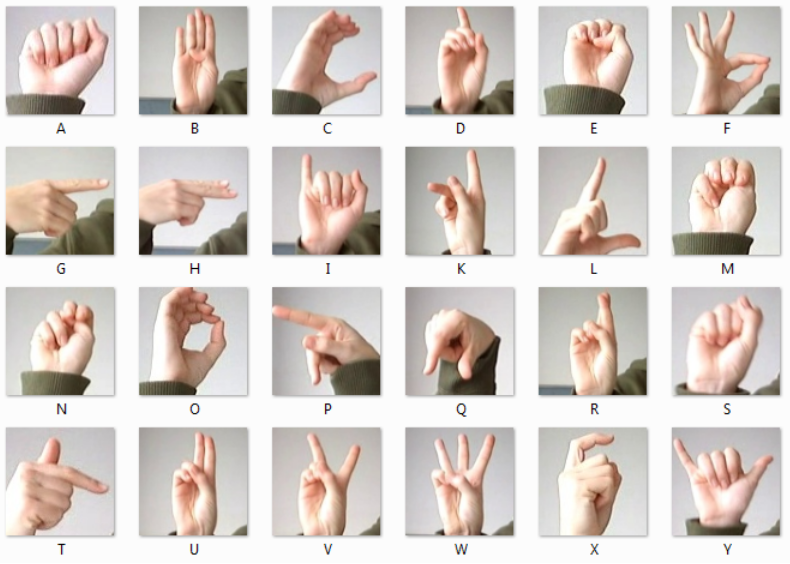







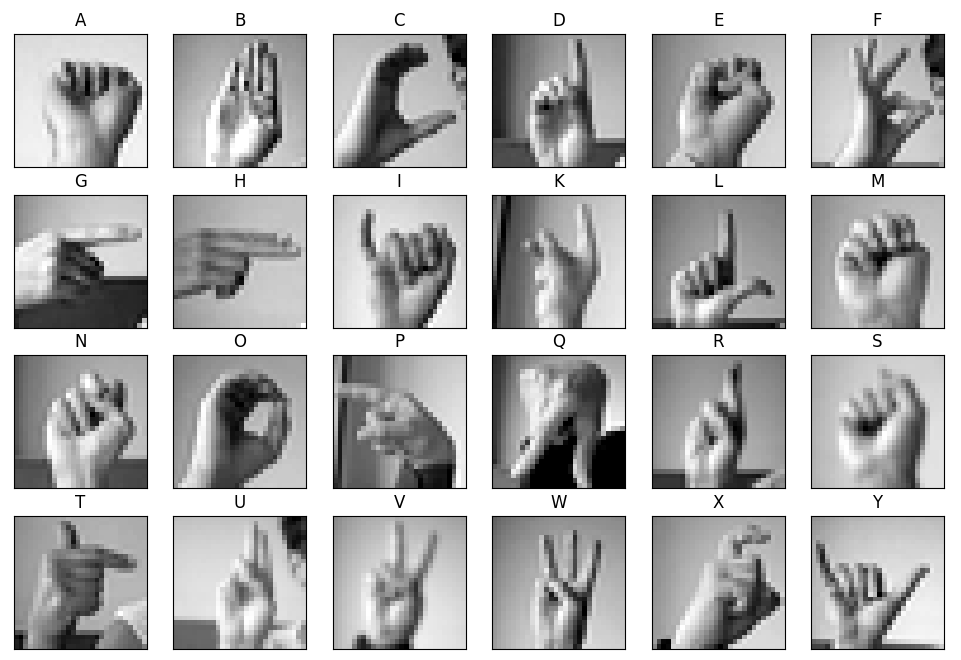




Build and train a CNN (for example like the one below) that achieves 99.5 % test accuracy  

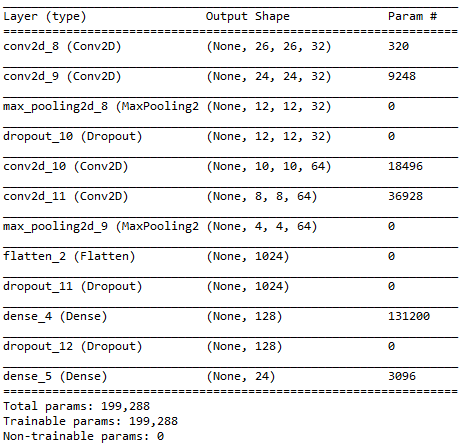

Calculate the predictions for a random test image and draw a picture like below.

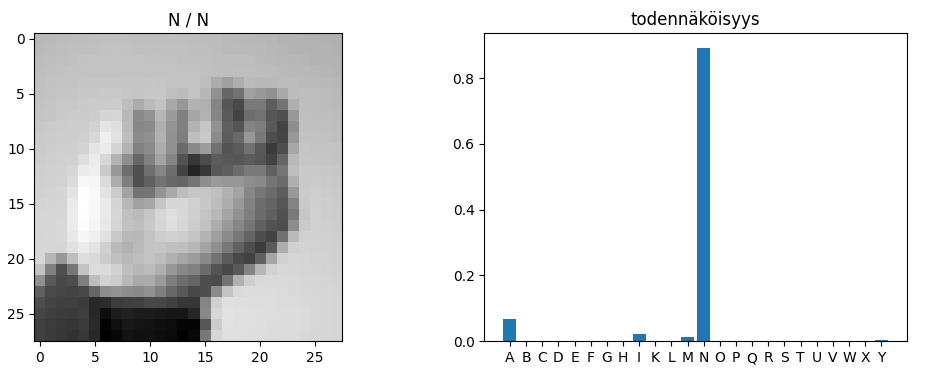

In [2]:

!pip install gdown

import gdown

file_id = '1n42ZJQUDxyOQHewXkuU3-Nle3-JwFTyt'
gdown.download(f'https://drive.google.com/uc?export=download&id={file_id}', 'sign_mnist.zip', quiet=False)

import zipfile

with zipfile.ZipFile('sign_mnist.zip', 'r') as zip_ref:
    zip_ref.extractall('sign_mnist')


Downloading...
From (original): https://drive.google.com/uc?export=download&id=1n42ZJQUDxyOQHewXkuU3-Nle3-JwFTyt
From (redirected): https://drive.google.com/uc?export=download&id=1n42ZJQUDxyOQHewXkuU3-Nle3-JwFTyt&confirm=t&uuid=e80b1357-c86f-4aee-8c45-ad668205b3bd
To: /content/sign_mnist.zip
100%|██████████| 27.7M/27.7M [00:12<00:00, 2.20MB/s]


In [3]:
#read as np.array
train_data=np.loadtxt('/content/sign_mnist/sign_mnist/sign_mnist_train.csv',delimiter=',',skiprows=1)
test_data=np.loadtxt('/content/sign_mnist/sign_mnist/sign_mnist_test.csv',delimiter=',',skiprows=1)

In [4]:
print(train_data.shape)
print(test_data.shape)

(27455, 785)
(7172, 785)


In [5]:
xtrain=train_data[:,1:]/255.0 #pixels to 0...1
ytrain=train_data[:,0] #classes
xtest=test_data[:,1:]/255.0
ytest=test_data[:,0]


In [6]:
#images to 3D arrays, shape (28,28,1)
mtrain=xtrain.shape[0]
mtest=xtest.shape[0]
xtrain=xtrain.reshape((mtrain,28,28,1))
xtest=xtest.reshape((mtest,28,28,1))

In [7]:
print(xtrain.shape)
print(xtest.shape)

(27455, 28, 28, 1)
(7172, 28, 28, 1)


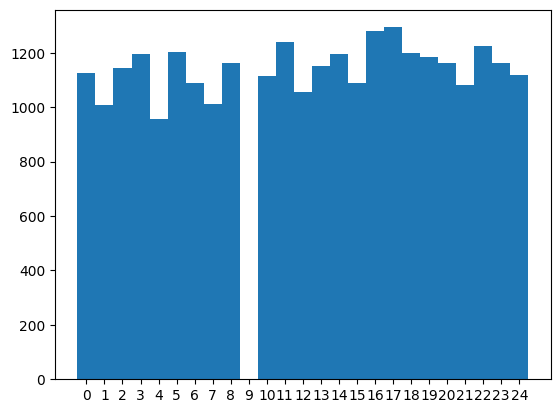

In [8]:
#distribution of classes
plt.hist(ytrain,bins=np.arange(-0.5,25.5,1))
plt.xticks(np.arange(0,25,1))
plt.show()

In [9]:
#class y=9 is missing (represents letter J))
#decrease classes 10...24 by one
ytrain[ytrain>9]=ytrain[ytrain>9]-1
ytest[ytest>9]=ytest[ytest>9]-1

Y=['A','B','C','D','E','F','G','H','I','K','L','M',
   'N','O','P','Q','R','S','T','U','V','W','X','Y']

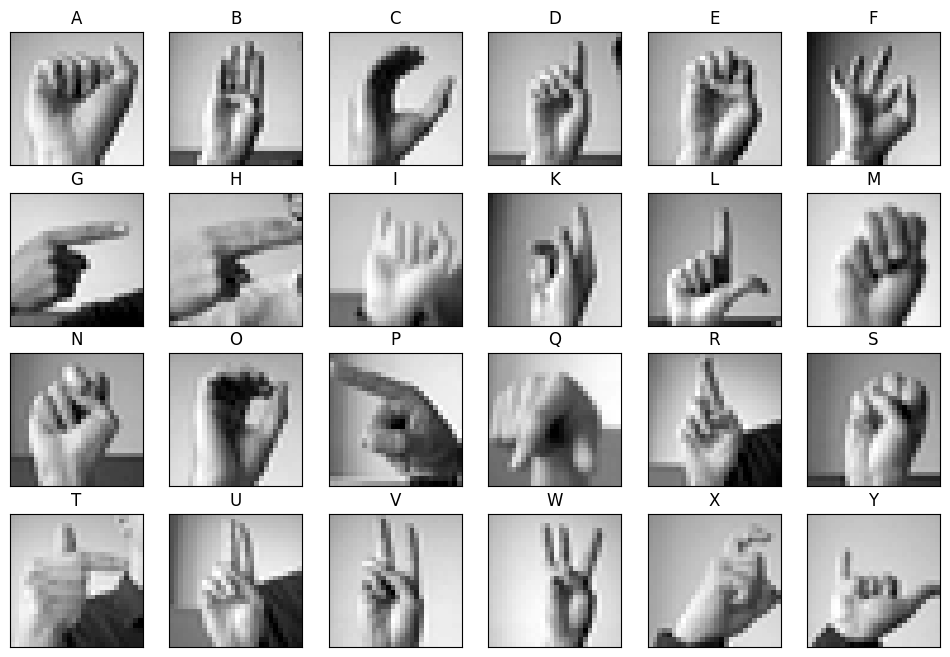

In [10]:
#example images
plt.figure(figsize=(12,8))
for k in range(24):
    xtraink=xtrain[ytrain==k,:]
    mk=xtraink.shape[0]
    indk=np.random.randint(mk)
    kuvak=xtraink[indk,:].reshape((28,28))
    plt.subplot(4,6,k+1)
    plt.imshow(kuvak, cmap='gray')
    plt.xticks([],[])
    plt.yticks([],[])
    plt.title(Y[k])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 256)       2560      
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 256)       590080    
                                                                 
 max_pooling2d (MaxPooling2  (None, 12, 12, 256)       0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 12, 12, 256)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 10, 10, 128)       295040    
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         147584    
                                                        

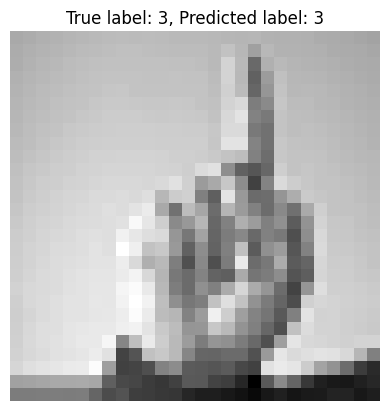

In [11]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random


# Preprocess the data
x_train = train_data[:, 1:] / 255.0  # Normalize pixel values to 0-1
y_train = train_data[:, 0]  # Labels
x_test = test_data[:, 1:] / 255.0
y_test = test_data[:, 0]

# Reshape images to 3D arrays (28, 28, 1)
m_train = x_train.shape[0]
m_test = x_test.shape[0]
x_train = x_train.reshape((m_train, 28, 28, 1))
x_test = x_test.reshape((m_test, 28, 28, 1))

# Adjust labels for missing class
y_train[y_train > 9] = y_train[y_train > 9] - 1
y_test[y_test > 9] = y_test[y_test > 9] - 1

# Convert labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train, 24)
y_test = tf.keras.utils.to_categorical(y_test, 24)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train)
# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True
)
datagen.fit(x_train)


model = models.Sequential([
    layers.Conv2D(256, (3, 3), activation='relu', input_shape=(28, 28, 1)),
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(24, activation='softmax')
])

# Compile
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


history = model.fit(datagen.flow(x_train, y_train, batch_size=256),
                    epochs=100,
                    validation_data=(x_test, y_test),
                    callbacks=[early_stopping])

test_loss, test_acc = model.evaluate(x_test, y_test)
print("Test accuracy:", test_acc)


random_index = random.randint(0, len(x_test) - 1)
random_image = x_test[random_index]
random_label = np.argmax(y_test[random_index])

prediction = model.predict(np.expand_dims(random_image, axis=0))
predicted_label = np.argmax(prediction)

print("True label:", random_label)
print("Predicted label:", predicted_label)


plt.imshow(random_image.squeeze(), cmap='gray')
plt.title(f'True label: {random_label}, Predicted label: {predicted_label}')
plt.axis('off')
plt.show()


1/1 [==============================] - 0s 20ms/step
True label: 15
Predicted label: 15


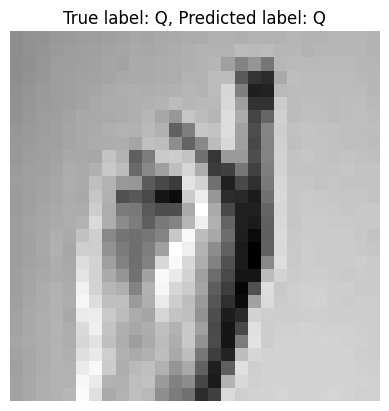

In [12]:
# Predictions
random_index = random.randint(0, len(x_test) - 1)
random_image = x_test[random_index]
random_label = np.argmax(y_test[random_index])

prediction = model.predict(np.expand_dims(random_image, axis=0))
predicted_label = np.argmax(prediction)

print("True label:", random_label)
print("Predicted label:", predicted_label)

# Draw the random test image
plt.imshow(random_image.squeeze(), cmap='gray')
plt.title(f'True label: {Y[random_label]}, Predicted label: {Y[predicted_label]}')
plt.axis('off')
plt.show()

## **EXERCISE 2**

[Sign-Language-Digits-Dataset](https://github.com/ardamavi/Sign-Language-Digits-Dataset)

100x100x3 images of hand-gesture numbers 0-9, 1441 training- and 618 test-images.



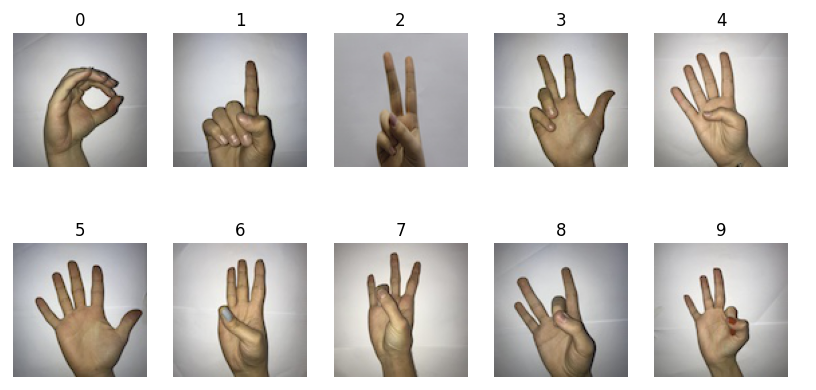

Build and train a CNN (for example like the one below) that achieves 99.5 % test accuracy.

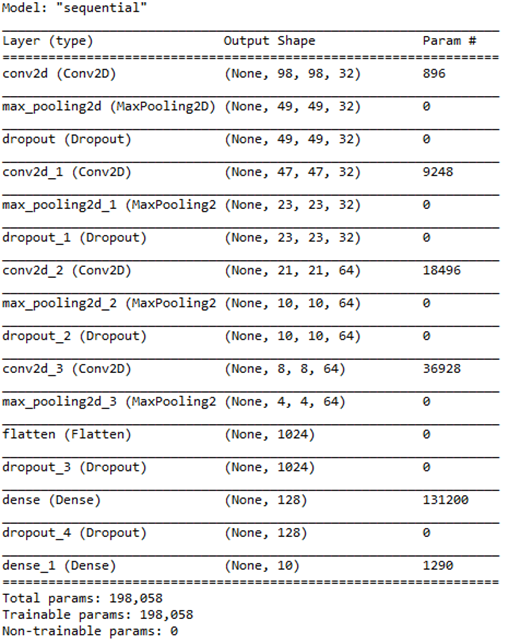

In [13]:
#get the images
!git clone 'https://github.com/ardamavi/Sign-Language-Digits-Dataset.git'

Cloning into 'Sign-Language-Digits-Dataset'...
remote: Enumerating objects: 2095, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 2095 (delta 2), reused 0 (delta 0), pack-reused 2089
Receiving objects: 100% (2095/2095), 15.07 MiB | 227.00 KiB/s, done.
Resolving deltas: 100% (660/660), done.


In [14]:
#number of images
import os
dir='/content/Sign-Language-Digits-Dataset/Dataset'
m=0
for k in range(10):
  dirk=dir+'/'+str(k)
  filenames=os.listdir(dirk)
  m+=len(filenames)
print(m)

2062


In [15]:
#images to 4D-array X and their classes to 1D-array y
X=np.zeros((m,100,100,3))
y=np.zeros(m)
corrupt=[] #list containing corrupted images (with size different from 100x100x3)
i=0 #number of an image

for k in range(10):
  dirk=dir+'/'+str(k)
  filenames=os.listdir(dirk)
  for filename in filenames:
    path=dirk+'/'+filename
    kuva=plt.imread(path)
    if kuva.shape==(100,100,3):
      X[i]=plt.imread(path)
      y[i]=k
      i+=1
    else:
      corrupt.append(kuva)


In [16]:
print(m)
print(i)
print(len(corrupt))
corrupt[0].shape

2062
2059
3


(3024, 3024, 3)

In [17]:
print(X[0].shape)
print(np.max(X[0]))
print(np.min(X[0]))

(100, 100, 3)
255.0
0.0


In [18]:
y[0]

0.0

In [19]:
#remove unnecessary zeros
X=X[:i]
y=y[:i]
#pixel values to 0...1
X=X/255.0

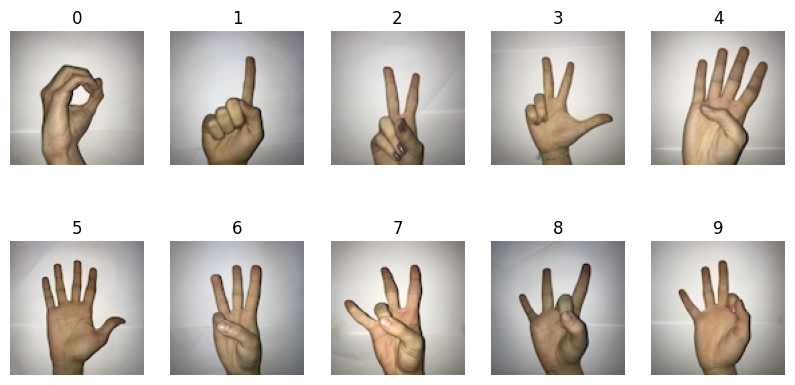

In [20]:
#example images
plt.figure(figsize=(10,5))
for k in range(10):
  Xk=X[y==k]
  plt.subplot(2,5,k+1)
  plt.imshow(Xk[0])
  plt.axis('off')
  plt.title(str(k))

In [21]:
#split to training- and test-images
from sklearn.model_selection import train_test_split
Xtrain,Xtest,ytrain,ytest=train_test_split(X,y,test_size=0.3,stratify=y)
print(Xtrain.shape)
print(Xtest.shape)

(1441, 100, 100, 3)
(618, 100, 100, 3)


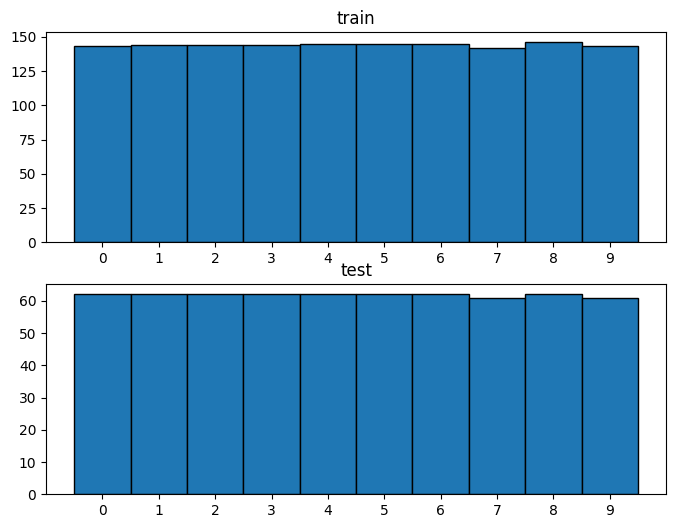

In [22]:
#distribution of classes
plt.figure(figsize=(8,6))
plt.subplot(211)
plt.hist(ytrain,bins=np.arange(-0.5,10.5,1),edgecolor='k')
plt.xticks(np.arange(0,10,1))
plt.title('train')
plt.subplot(212)
plt.hist(ytest,bins=np.arange(-0.5,10.5,1),edgecolor='k')
plt.xticks(np.arange(0,10,1))
plt.title('test')
plt.show()

In [23]:

!git clone 'https://github.com/ardamavi/Sign-Language-Digits-Dataset.git'


fatal: destination path 'Sign-Language-Digits-Dataset' already exists and is not an empty directory.


In [24]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
   layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(10, activation='softmax')
])

Total images: 2062
Training set shape: (1441, 100, 100, 3)
Test set shape: (618, 100, 100, 3)
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 49, 49, 32)        0         
 g2D)                                                            
                                                                 
 dropout_9 (Dropout)         (None, 49, 49, 32)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 47, 47, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 23, 23, 64)        0         
 g2D)                                                            
                          

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


23/23 [==============================] - ETA: 0s - loss: 2.3035 - accuracy: 0.0923
Epoch 2: val_accuracy did not improve from 0.10194
23/23 [==============================] - 3s 124ms/step - loss: 2.3035 - accuracy: 0.0923 - val_loss: 2.3026 - val_accuracy: 0.0987
Epoch 3/200
23/23 [==============================] - ETA: 0s - loss: 2.3029 - accuracy: 0.0916
Epoch 3: val_accuracy did not improve from 0.10194
23/23 [==============================] - 3s 120ms/step - loss: 2.3029 - accuracy: 0.0916 - val_loss: 2.3026 - val_accuracy: 0.1003
Epoch 4/200
23/23 [==============================] - ETA: 0s - loss: 2.3029 - accuracy: 0.0909
Epoch 4: val_accuracy did not improve from 0.10194
23/23 [==============================] - 3s 122ms/step - loss: 2.3029 - accuracy: 0.0909 - val_loss: 2.3026 - val_accuracy: 0.1003
Epoch 5/200
23/23 [==============================] - ETA: 0s - loss: 2.3029 - accuracy: 0.0999
Epoch 5: val_accuracy improved from 0.10194 to 0.12136, saving model to finger_model.h

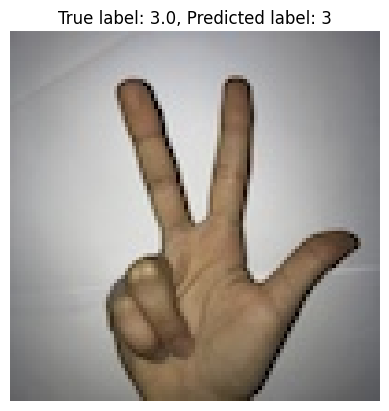

In [25]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint


dir = '/content/Sign-Language-Digits-Dataset/Dataset'
m = 0
for k in range(10):
    dirk = dir + '/' + str(k)
    filenames = os.listdir(dirk)
    m += len(filenames)
print(f'Total images: {m}')


X = np.zeros((m, 100, 100, 3))
y = np.zeros(m)
corrupt = []

i = 0
for k in range(10):
    dirk = dir + '/' + str(k)
    filenames = os.listdir(dirk)
    for filename in filenames:
        path = dirk + '/' + filename
        kuva = plt.imread(path)
        if kuva.shape == (100, 100, 3):
            X[i] = kuva
            y[i] = k
            i += 1
        else:
            corrupt.append(kuva)

# Remove unnecessary zeros
X = X[:i]
y = y[:i]

# Normalize pixel values to 0...1
X = X / 255.0

# Split into training and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, stratify=y)
print(f'Training set shape: {Xtrain.shape}')
print(f'Test set shape: {Xtest.shape}')




model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(10, activation='softmax')
])


model.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

checkpoint_callback = ModelCheckpoint(
    filepath='finger_model.hdf5',
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True
)


history = model.fit(datagen.flow(Xtrain, ytrain, batch_size=64), epochs=200, validation_data=(Xtest, ytest), callbacks=[checkpoint_callback])


test_loss, test_acc = model.evaluate(Xtest, ytest)
print(f'Test Accuracy: {test_acc*100:.2f}%')


import random

random_index = random.randint(0, len(Xtest) - 1)
random_image = Xtest[random_index]
random_label = ytest[random_index]

prediction = model.predict(np.expand_dims(random_image, axis=0))
predicted_label = np.argmax(prediction)

print("True label:", random_label)
print("Predicted label:", predicted_label)

plt.imshow(random_image)
plt.title(f'True label: {random_label}, Predicted label: {predicted_label}')
plt.axis('off')
plt.show()


1/1 [==============================] - 0s 22ms/step
True label: 3.0
Predicted label: 3


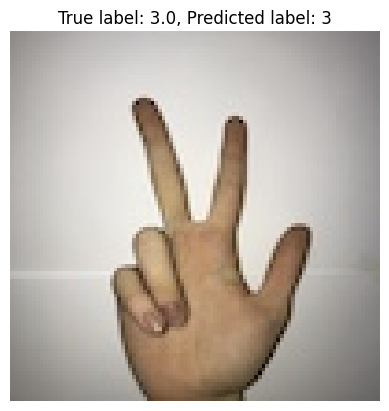

In [26]:

import random

random_index = random.randint(0, len(Xtest) - 1)
random_image = Xtest[random_index]
random_label = ytest[random_index]

prediction = model.predict(np.expand_dims(random_image, axis=0))
predicted_label = np.argmax(prediction)

print("True label:", random_label)
print("Predicted label:", predicted_label)

plt.imshow(random_image)
plt.title(f'True label: {random_label}, Predicted label: {predicted_label}')
plt.axis('off')
plt.show()


##**EXERCISES 3 and 4**

[Flowers-dataset](https://www.tensorflow.org/datasets/catalog/tf_flowers)

Contains 3670 images of flowers daisy, dandelion, rose, tulip and sunflower,
2570 training- and 1100 test-images.


In [27]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models,optimizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf


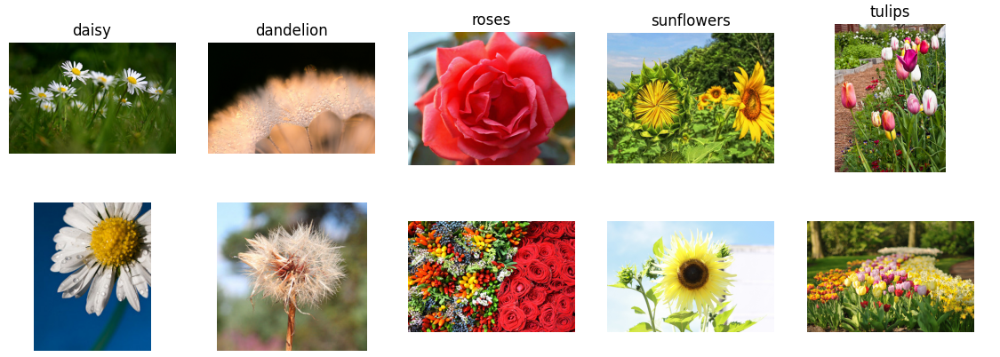

In [28]:
#load flower images
from tensorflow import keras
_URL = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"

zip_dir = keras.utils.get_file(origin=_URL,
                                   fname="flower_photos.tgz",
                                   extract=True)

228813984/228813984 [==============================] - 373s 2us/step


In [29]:
import os
zip_dir_base = os.path.dirname(zip_dir)
!find $zip_dir_base -type d -print

/root/.keras/datasets
/root/.keras/datasets/flower_photos
/root/.keras/datasets/flower_photos/sunflowers
/root/.keras/datasets/flower_photos/tulips
/root/.keras/datasets/flower_photos/daisy
/root/.keras/datasets/flower_photos/dandelion
/root/.keras/datasets/flower_photos/roses


In [30]:
base_dir = os.path.join(os.path.dirname(zip_dir), 'flower_photos')
base_dir

'/root/.keras/datasets/flower_photos'

In [31]:
categories = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [32]:
m=np.zeros(5) #number of images in each class

for k in range(5):
  category=categories[k]
  category_dir=os.path.join(base_dir, category)
  m[k]=len(os.listdir(category_dir))


m=m.astype(int)
print(m)
print(sum(m))

[633 898 641 699 799]
3670


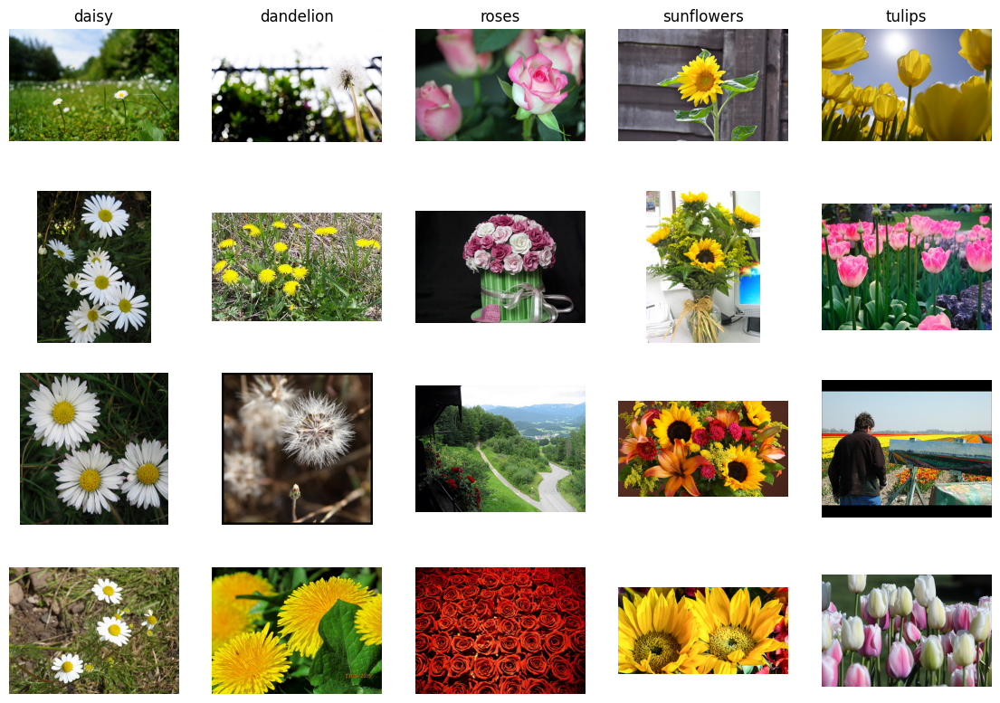

In [33]:
#example images
plt.figure(figsize=(14,10))
for k in range(5):
  category=categories[k]
  flower_folder=os.path.join(base_dir, category)
  flower_names=os.listdir(flower_folder)
  n=np.random.randint(0,m[k],4)
  for i in range(4):
    flower_name=flower_names[n[i]]
    flower_path=os.path.join(flower_folder,flower_name)
    kuva=plt.imread(flower_path)
    plt.subplot(4,5,1+k+i*5)
    plt.imshow(kuva)
    plt.axis('off')
    if i==0:
      plt.title(category)


In [34]:
#folders for training and test-images
target_dir = '/content/flowers'
os.mkdir(target_dir)

train_dir = os.path.join(target_dir, 'train')
os.mkdir(train_dir)

test_dir = os.path.join(target_dir, 'test')
os.mkdir(test_dir)

In [35]:
for category in categories:
  category_train_dir=os.path.join(train_dir, category)
  os.mkdir(category_train_dir)
  category_test_dir=os.path.join(test_dir, category)
  os.mkdir(category_test_dir)

In [36]:
print(0.7*m)

[443.1 628.6 448.7 489.3 559.3]


In [37]:
mtrain=[443,629,449,489,560] #number of train-images, ~70 %
print(np.sum(mtrain))
print(mtrain/m)

2570
[0.69984202 0.70044543 0.70046802 0.69957082 0.7008761 ]


In [38]:
import shutil

#split to train and test-images
for k in range(5):
  category=categories[k]
  src_dir=os.path.join(base_dir,category)
  dst_train_dir=os.path.join(train_dir,category)
  dst_test_dir=os.path.join(test_dir,category)
  fnames=os.listdir(src_dir)
  rp=np.random.permutation(m[k])
  for n in range(m[k]):
    fname=fnames[rp[n]]
    src = os.path.join(src_dir, fname)
    if n<mtrain[k]:
        dst = os.path.join(dst_train_dir, fname)
    else:
        dst = os.path.join(dst_test_dir, fname)
    shutil.copyfile(src, dst)

In [39]:
for category in categories:
  tr_dir=os.path.join(train_dir,category)
  tr=os.listdir(tr_dir)
  te_dir=os.path.join(test_dir,category)
  te=os.listdir(te_dir)
  print(category +': train ' + str(len(tr)) + ', test ' + str(len(te)))

daisy: train 443, test 190
dandelion: train 629, test 269
roses: train 449, test 192
sunflowers: train 489, test 210
tulips: train 560, test 239


In [40]:

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 2570 images belonging to 5 classes.
Found 1100 images belonging to 5 classes.


###**EXERCISE 3**


Flowers-dataset

Contains 3670 images of flowers daisy, dandelion, rose, tulip and sunflower, 2570 training- and 1100 test-images.
Build and train a CNN that achieves 80% test accuracy.

Use image size 150x150 and data augmentation.

Epoch 1/100
80/80 [==============================] - 18s 211ms/step - loss: 1.4743 - accuracy: 0.3136 - val_loss: 1.2258 - val_accuracy: 0.4770
Epoch 2/100
80/80 [==============================] - 18s 220ms/step - loss: 1.2537 - accuracy: 0.4464 - val_loss: 1.1690 - val_accuracy: 0.5175
Epoch 3/100
80/80 [==============================] - 17s 210ms/step - loss: 1.1548 - accuracy: 0.5240 - val_loss: 1.1255 - val_accuracy: 0.5625
Epoch 4/100
80/80 [==============================] - 17s 213ms/step - loss: 1.0717 - accuracy: 0.5654 - val_loss: 1.0747 - val_accuracy: 0.5855
Epoch 5/100
80/80 [==============================] - 18s 221ms/step - loss: 0.9867 - accuracy: 0.6151 - val_loss: 0.9205 - val_accuracy: 0.6241
Epoch 6/100
80/80 [==============================] - 17s 213ms/step - loss: 0.9549 - accuracy: 0.6288 - val_loss: 0.8819 - val_accuracy: 0.6608
Epoch 7/100
80/80 [==============================] - 17s 212ms/step - loss: 0.8770 - accuracy: 0.6627 - val_loss: 0.8675 - val_accuracy:

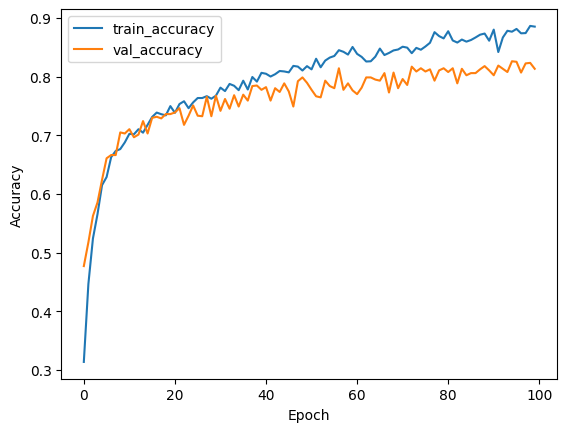

In [54]:
# Build the model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(5, activation='softmax')
])

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.001),
              metrics=['accuracy'])

# Callbacks for early stopping and model checkpointing
callbacks = [
    ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True, mode='max')
]

# Train the model
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    steps_per_epoch=train_generator.samples // 32,
    validation_steps=test_generator.samples // 32,
    callbacks=callbacks
)
# Evaluate the model
test_loss, test_acc = model.evaluate(test_generator)
print("Test accuracy:", test_acc * 100)
# Visualize training history
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()



###**EXERCISE 4**

Flowers-dataset
Contains 3670 images of flowers daisy, dandelion, rose, tulip and sunflower, 2570 training- and 1100 test-images.
Build and train a neural net using VGG16 that achieves 89 % test accuracy.

Epoch 1/100
80/80 [==============================] - 74s 917ms/step - loss: 1.1394 - accuracy: 0.6158 - val_loss: 0.7774 - val_accuracy: 0.7059
Epoch 2/100
80/80 [==============================] - 76s 953ms/step - loss: 0.7415 - accuracy: 0.7281 - val_loss: 0.7538 - val_accuracy: 0.7188
Epoch 3/100
80/80 [==============================] - 78s 974ms/step - loss: 0.6493 - accuracy: 0.7561 - val_loss: 0.6762 - val_accuracy: 0.7638
Epoch 4/100
80/80 [==============================] - 79s 992ms/step - loss: 0.6220 - accuracy: 0.7687 - val_loss: 0.6820 - val_accuracy: 0.7509
Epoch 5/100
80/80 [==============================] - 78s 979ms/step - loss: 0.5829 - accuracy: 0.7920 - val_loss: 0.6979 - val_accuracy: 0.7601
Epoch 6/100
80/80 [==============================] - 78s 980ms/step - loss: 0.5791 - accuracy: 0.7813 - val_loss: 0.6200 - val_accuracy: 0.7868
Epoch 7/100
80/80 [==============================] - 78s 978ms/step - loss: 0.5534 - accuracy: 0.7967 - val_loss: 0.5873 - val_accuracy:

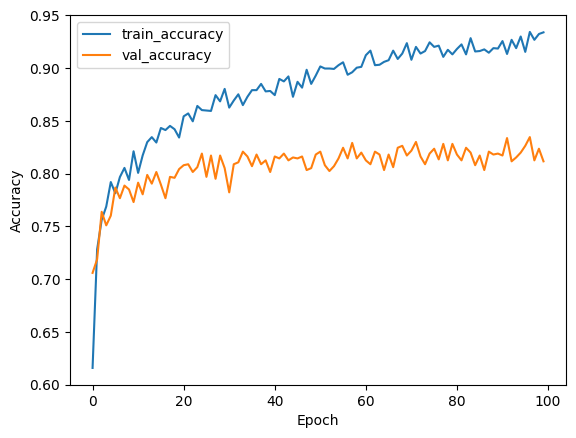

In [56]:

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

conv_base.trainable = False

model = models.Sequential([
    conv_base,
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(5, activation='softmax')
])


model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])


history = model.fit(
    train_generator,
    epochs=100,
    validation_data=test_generator,
    steps_per_epoch=train_generator.samples // 32,
    validation_steps=test_generator.samples // 32)


test_loss, test_acc = model.evaluate(test_generator)
print("Test accuracy:", test_acc * 100)


plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
